In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data=pd.read_csv("C:\\Users\\Tejas\\HealthApp_2k.log_structured.csv")
data

,LineId,Time,Component,Pid,Content,EventId,EventTemplate
0,1,20171223-22:15:29:606,Step_LSC,30002312,onStandStepChanged 3579,E42,onStandStepChanged <*>
1,2,20171223-22:15:29:615,Step_LSC,30002312,onExtend:1514038530000 14 0 4,E39,onExtend:<*> <*> <*> <*>
2,3,20171223-22:15:29:633,Step_StandReportReceiver,30002312,onReceive action: android.intent.action.SCREEN_ON,E41,onReceive action: android.intent.action.SCREEN_ON
3,4,20171223-22:15:29:635,Step_LSC,30002312,processHandleBroadcastAction action:android.in...,E43,processHandleBroadcastAction action:android.in...
4,5,20171223-22:15:29:635,Step_StandStepCounter,30002312,flush sensor data,E12,flush sensor data
...,...,...,...,...,...,...,...
1995,1996,20171224-0:58:53:985,Step_LSC,30002312,processHandleBroadcastAction action:android.in...,E44,processHandleBroadcastAction action:android.in...
1996,1997,20171224-0:59:7:581,Step_LSC,30002312,processHandleBroadcastAction action:android.in...,E44,processHandleBroadcastAction action:android.in...
1997,1998,20171224-1:0:0:794,Step_LSC,30002312,processHandleBroadcastAction action:android.in...,E44,processHandleBroadcastAction action:android.in...
1998,1999,20171224-1:1:0:935,Step_LSC,30002312,processHandleBroadcastAction action:android.in...,E44,processHandleBroadcastAction action:android.in...


In [3]:
print(data.columns)

Index(['LineId', 'Time', 'Component', 'Pid', 'Content', 'EventId',
       'EventTemplate'],
      dtype='object')


In [4]:
# Convert the 'Time' column to a datetime object with the specified format
data['Time'] = pd.to_datetime(data['Time'], format='%Y%m%d-%H:%M:%S:%f')

In [5]:
# Extract date and time components
data['Date'] = data['Time'].dt.date
data['Hour'] = data['Time'].dt.hour

In [6]:
# Number of logs per component
component_counts = data['Component'].value_counts()
component_counts

Component
Step_LSC                       710
Step_SPUtils                   494
Step_ExtSDM                    482
Step_StandReportReceiver       171
HiH_HiSyncControl               42
Step_StandStepCounter           19
HiH_DataStatManager             17
HiH_HiHealthDataInsertStore     11
HiH_                            10
HiH_HiHealthBinder               9
HiH_HiAppUtil                    8
Step_FlushableStepDataCache      8
HiH_HiBroadcastUtil              5
Step_StandStepDataManager        5
HiH_ListenerManager              2
HiH_HiSyncUtil                   2
Step_HGNH                        2
Step_ScreenUtil                  1
Step_DataCache                   1
Step_NotificationUtil            1
Name: count, dtype: int64

In [7]:
# Number of logs per day
daily_log_counts = data.groupby('Date')['LineId'].count()
daily_log_counts

Date
2017-12-23    1776
2017-12-24     224
Name: LineId, dtype: int64

In [8]:
# Number of logs per hour
hourly_log_counts = data.groupby('Hour')['LineId'].count()
hourly_log_counts

Hour
0      221
1        3
22    1243
23     533
Name: LineId, dtype: int64

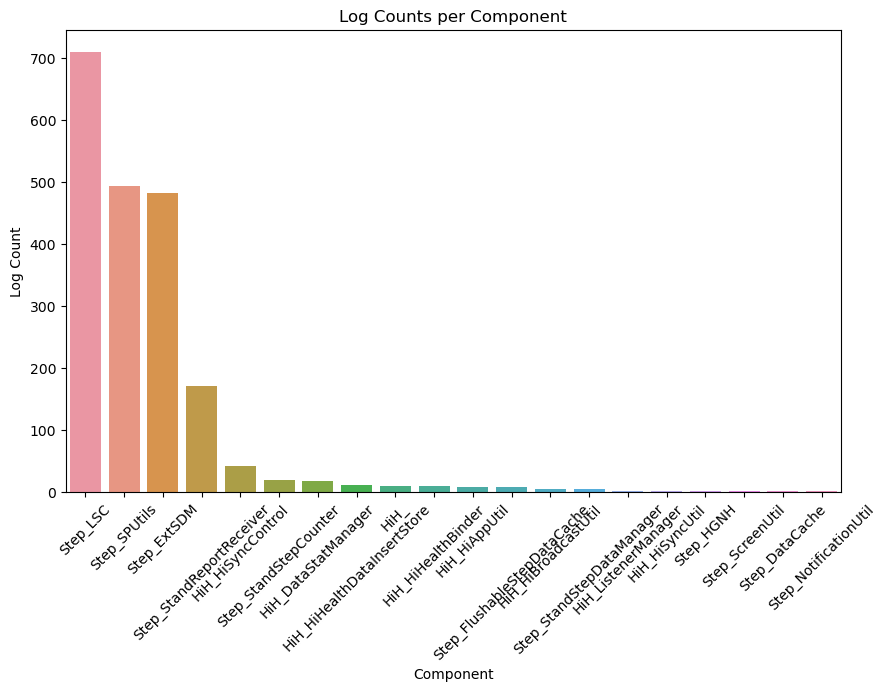

In [9]:
# Visualization of log counts per component
plt.figure(figsize=(10, 6))
sns.barplot(x=component_counts.index, y=component_counts.values)
plt.xticks(rotation=45)
plt.xlabel('Component')
plt.ylabel('Log Count')
plt.title('Log Counts per Component')
plt.show()

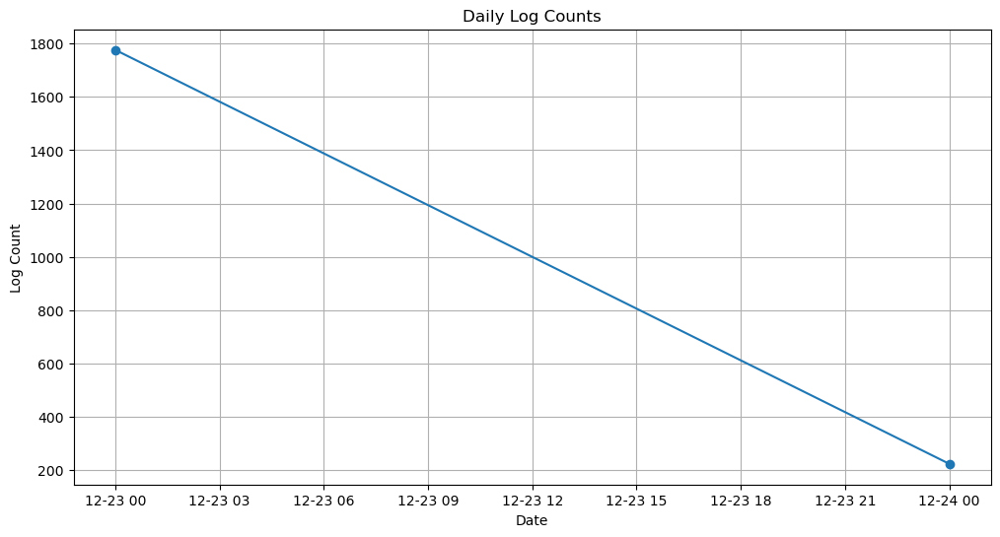

In [10]:
# Visualization of daily log counts
plt.figure(figsize=(12, 6))
daily_log_counts.plot(kind='line', marker='o')
plt.xlabel('Date')
plt.ylabel('Log Count')
plt.title('Daily Log Counts')
plt.grid(True)
plt.show()

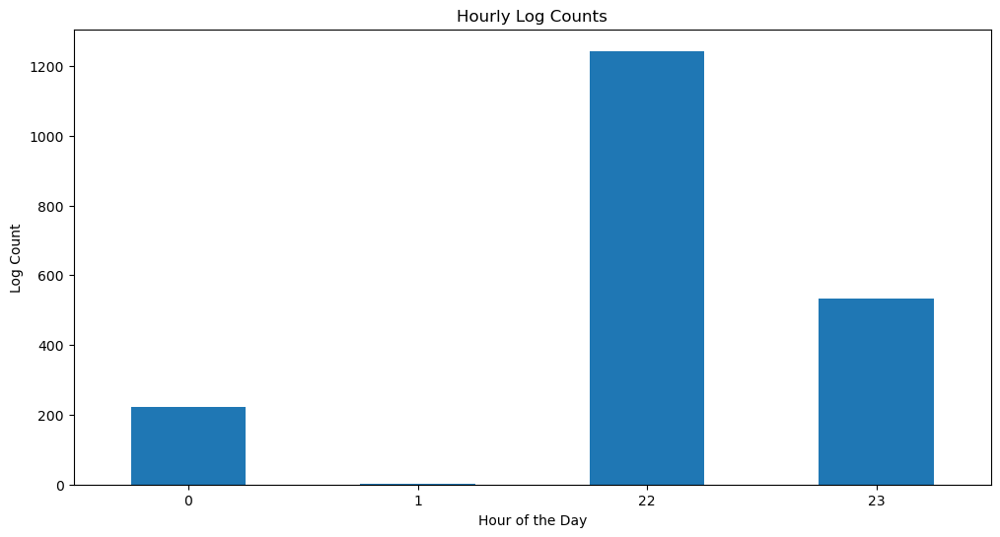

In [11]:
# Visualization of hourly log counts
plt.figure(figsize=(12, 6))
hourly_log_counts.plot(kind='bar')
plt.xlabel('Hour of the Day')
plt.ylabel('Log Count')
plt.title('Hourly Log Counts')
plt.xticks(rotation=0)
plt.show()

In [12]:
# Calculate active times (e.g., based on component or event type)
active_times = data[data['Component'] == 'YourComponent']['Time']
active_times

Series([], Name: Time, dtype: datetime64[ns])

In [13]:
# Calculate workout session duration
workout_sessions = data[data['EventTemplate'].str.contains('Workout')]
workout_sessions['Duration'] = workout_sessions.groupby('Pid')['Time'].diff().fillna(pd.Timedelta(seconds=0))
workout_sessions

,LineId,Time,Component,Pid,Content,EventId,EventTemplate,Date,Hour,Duration


In [14]:
# Calculate steps taken on a daily basis if available
# Assuming 'Content' contains step count information
data['Steps'] = data['Content'].str.extract(r'Steps: (\d+)').astype(float)
daily_steps = data.groupby('Date')['Steps'].sum()
daily_steps

Date
2017-12-23    0.0
2017-12-24    0.0
Name: Steps, dtype: float64

In [15]:
# Identify active times during workout sessions
# Assuming 'EventTemplate' contains information about workout sessions
active_times_during_workout = data[data['EventTemplate'].str.contains('Workout')]
active_times_during_workout['Hour'] = active_times_during_workout['Time'].dt.hour
active_hourly_counts = active_times_during_workout.groupby('Hour')['LineId'].count()
active_hourly_counts

Series([], Name: LineId, dtype: int64)

In [16]:
# Identify the most common components
most_common_components = data['Component'].value_counts().head(10)
most_common_components

Component
Step_LSC                       710
Step_SPUtils                   494
Step_ExtSDM                    482
Step_StandReportReceiver       171
HiH_HiSyncControl               42
Step_StandStepCounter           19
HiH_DataStatManager             17
HiH_HiHealthDataInsertStore     11
HiH_                            10
HiH_HiHealthBinder               9
Name: count, dtype: int64

In [17]:
# Calculate the average duration of workout sessions
average_workout_duration = workout_sessions['Duration'].mean()
average_workout_duration

NaT

In [18]:
# Calculate the total number of unique Pids
unique_pids = data['Pid'].nunique()
unique_pids

1

In [19]:
# Identify the most frequent EventTemplates
most_frequent_event_templates = data['EventTemplate'].value_counts().head(10)
most_frequent_event_templates

EventTemplate
onExtend:<*> <*> <*> <*>                                               273
onStandStepChanged <*>                                                 260
getTodayTotalDetailSteps = <*>##<*>##<*>##<*>##<*>##<*>                242
setTodayTotalDetailSteps=<*>                                           241
calculateAltitudeWithCache totalAltitude=<*>                           241
calculateCaloriesWithCache totalCalories=<*>                           241
processHandleBroadcastAction action:android.intent.action.TIME_TICK    144
REPORT : <*> <*> <*> <*>                                               136
flush sensor data                                                       17
onReceive action: android.intent.action.SCREEN_OFF                      17
Name: count, dtype: int64

In [20]:
# Calculate the hourly distribution of events
hourly_event_distribution = data.groupby('Hour')['LineId'].count()
hourly_event_distribution

Hour
0      221
1        3
22    1243
23     533
Name: LineId, dtype: int64

In [21]:
# Analytics 16: Calculate the daily distribution of events
daily_event_distribution = data.groupby('Date')['LineId'].count()
daily_event_distribution

Date
2017-12-23    1776
2017-12-24     224
Name: LineId, dtype: int64

In [22]:
# Analytics 17: Calculate the average event count per day
average_event_count_per_day = daily_event_distribution.mean()
average_event_count_per_day

1000.0

In [23]:
# Analytics 19: Calculate the correlation between event counts and steps taken per Pid
correlation_event_steps = data.groupby('Pid')[['LineId', 'Steps']].corr().iloc[0::2, -1]
correlation_event_steps

Pid             
30002312  LineId   NaN
Name: Steps, dtype: float64

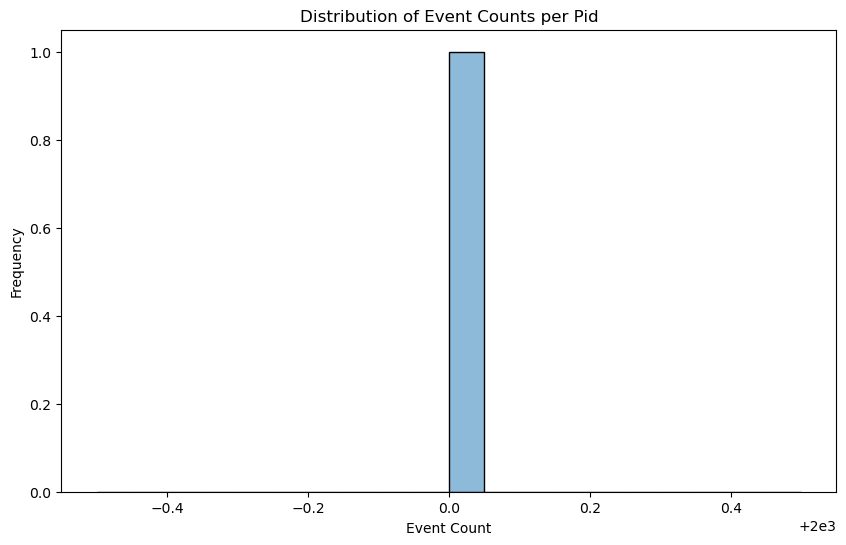

In [24]:
# Calculate the number of events per Pid
events_per_pid = data.groupby('Pid')['LineId'].count()

# Visualize the distribution of event counts per Pid
plt.figure(figsize=(10, 6))
sns.histplot(events_per_pid, bins=20, kde=True)
plt.xlabel('Event Count')
plt.ylabel('Frequency')
plt.title('Distribution of Event Counts per Pid')
plt.show()


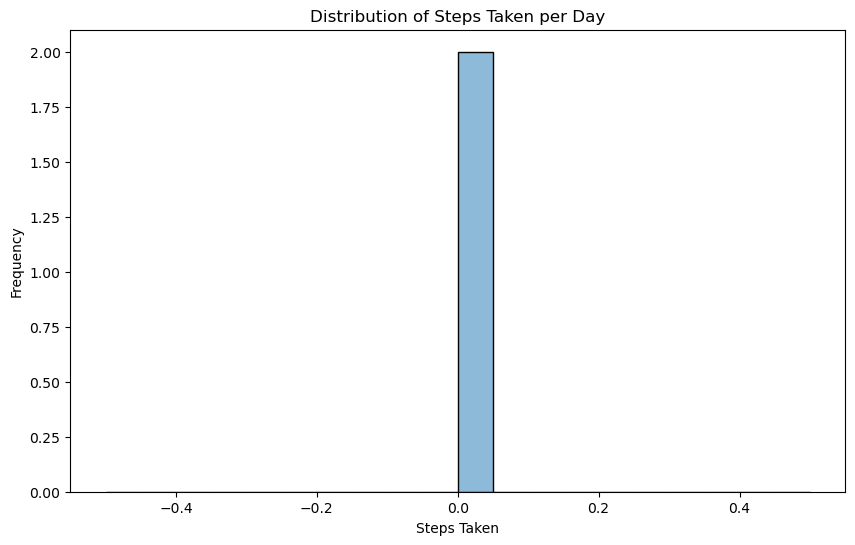

In [25]:
# Analytics 22: Visualize the distribution of steps taken per day
plt.figure(figsize=(10, 6))
sns.histplot(daily_steps, bins=20, kde=True)
plt.xlabel('Steps Taken')
plt.ylabel('Frequency')
plt.title('Distribution of Steps Taken per Day')
plt.show()

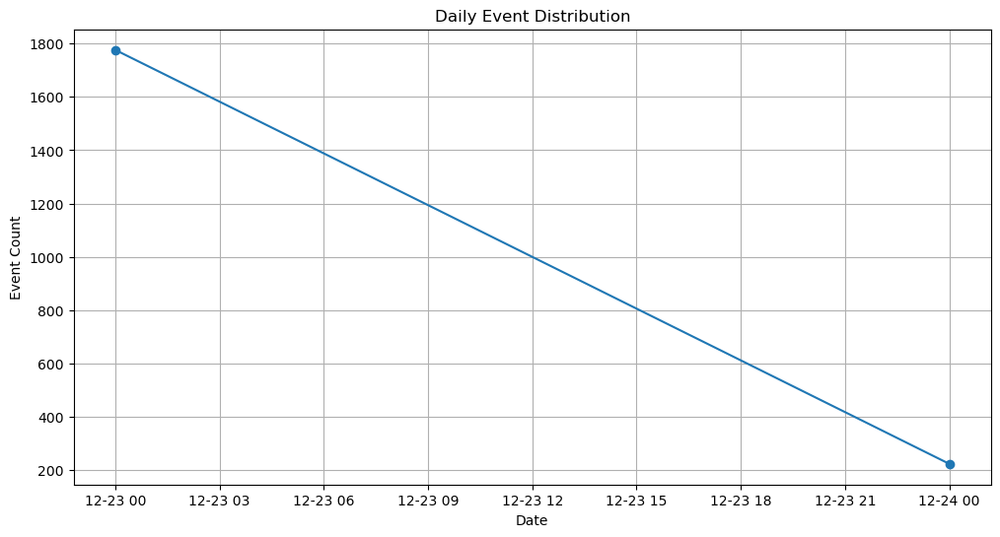

In [26]:
# Visualize the daily distribution of event counts
plt.figure(figsize=(12, 6))
daily_event_distribution.plot(kind='line', marker='o')
plt.xlabel('Date')
plt.ylabel('Event Count')
plt.title('Daily Event Distribution')
plt.grid(True)
plt.show()

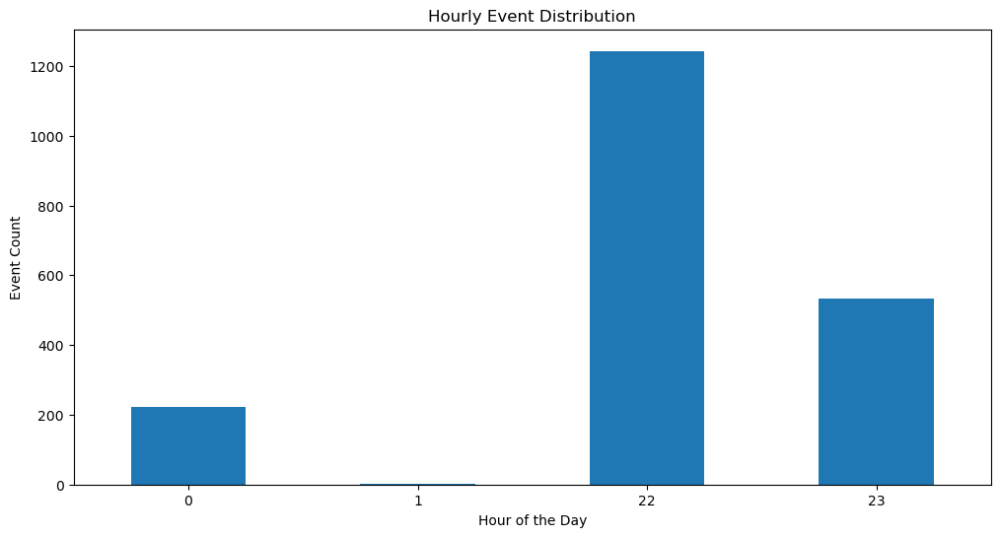

In [27]:
# Visualize the hourly distribution of event counts
plt.figure(figsize=(12, 6))
hourly_event_distribution.plot(kind='bar')
plt.xlabel('Hour of the Day')
plt.ylabel('Event Count')
plt.title('Hourly Event Distribution')
plt.xticks(rotation=0)
plt.show()

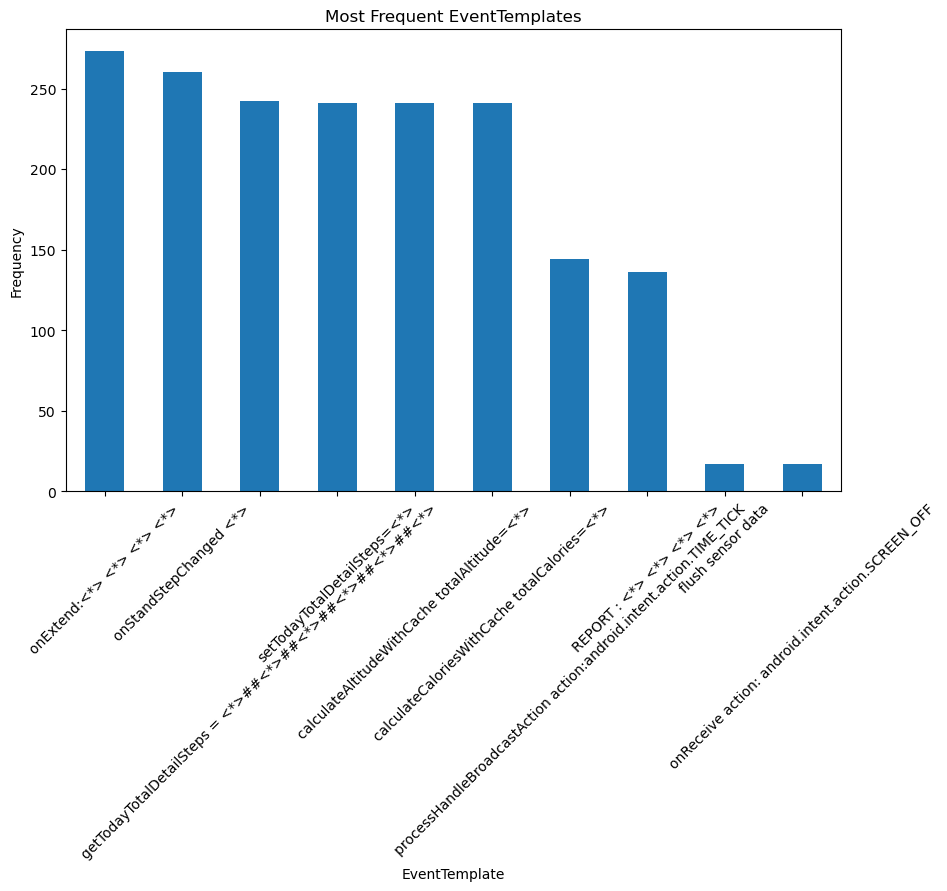

In [28]:
# Visualize the most common EventTemplates
plt.figure(figsize=(10, 6))
most_frequent_event_templates.plot(kind='bar')
plt.xlabel('EventTemplate')
plt.ylabel('Frequency')
plt.title('Most Frequent EventTemplates')
plt.xticks(rotation=45)
plt.show()


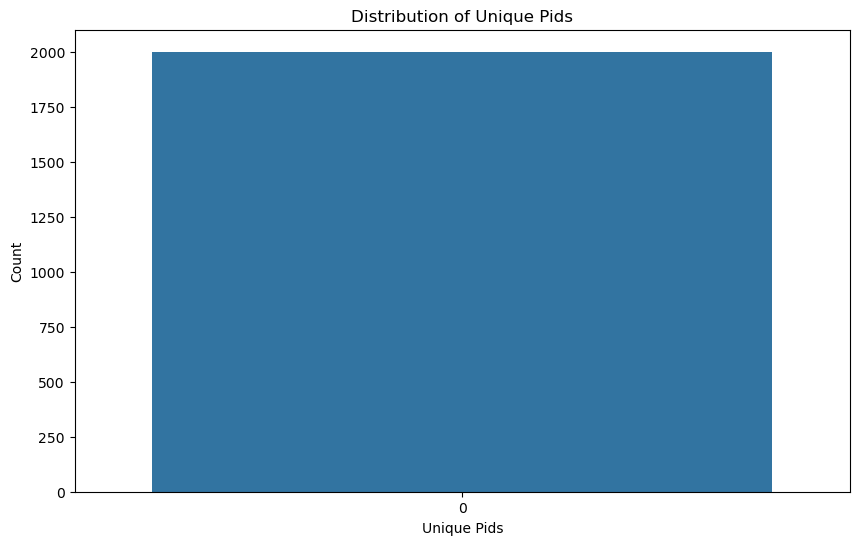

In [29]:
# Visualize the distribution of unique Pids
plt.figure(figsize=(10, 6))
sns.countplot(data['Pid'])
plt.xlabel('Unique Pids')
plt.ylabel('Count')
plt.title('Distribution of Unique Pids')
plt.show()


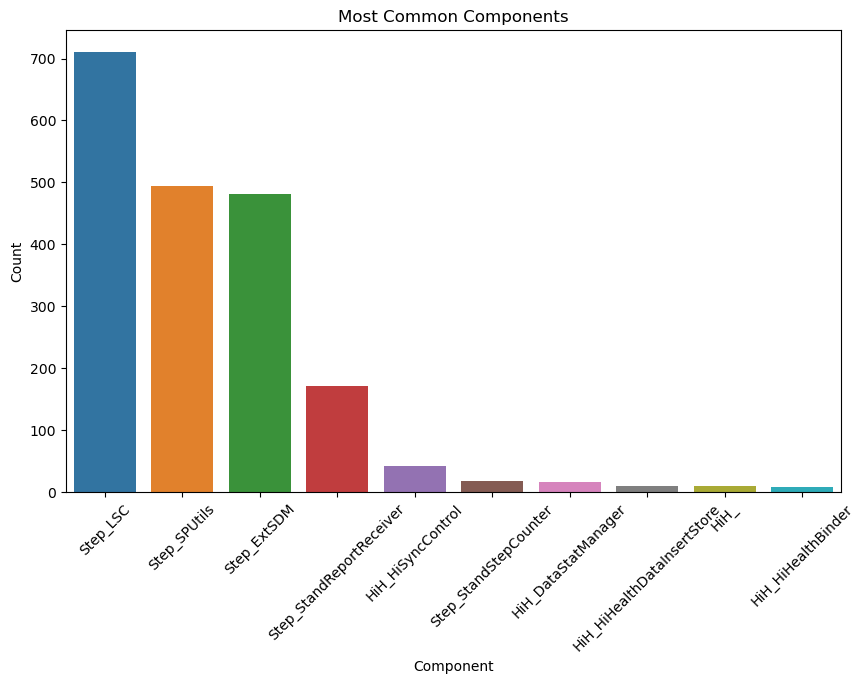

In [30]:
# Visualize the most common components
plt.figure(figsize=(10, 6))
sns.barplot(x=most_common_components.index, y=most_common_components.values)
plt.xlabel('Component')
plt.ylabel('Count')
plt.title('Most Common Components')
plt.xticks(rotation=45)
plt.show()

In [31]:
# Count the occurrences of each EventId
most_common_event_types = data['EventId'].value_counts().head(10)
most_common_event_types

EventId
E39    273
E42    260
E22    242
E58    241
E3     241
E4     241
E44    144
E47    136
E12     17
E40     17
Name: count, dtype: int64

In [32]:
# Calculate the average event count per component
average_event_count_per_component = data.groupby('Component')['LineId'].count().mean()
average_event_count_per_component

100.0

In [33]:
# Find the top N busiest days based on event count
N=5
busiest_days = daily_event_distribution.nlargest(N)
busiest_days

Date
2017-12-23    1776
2017-12-24     224
Name: LineId, dtype: int64

In [34]:
# Calculate the total duration of workout sessions
total_workout_duration = workout_sessions['Duration'].sum()
total_workout_duration

Timedelta('0 days 00:00:00')

In [35]:
# Find the Pids with the highest step counts
top_pids_steps = data.groupby('Pid')['Steps'].sum().nlargest(10)
top_pids_steps

Pid
30002312    0.0
Name: Steps, dtype: float64

In [36]:
# Calculate the average time interval between consecutive events for each Pid
average_time_interval_per_pid = data.groupby('Pid')['Time'].diff().mean()
average_time_interval_per_pid

Timedelta('0 days 00:00:05.015599299')

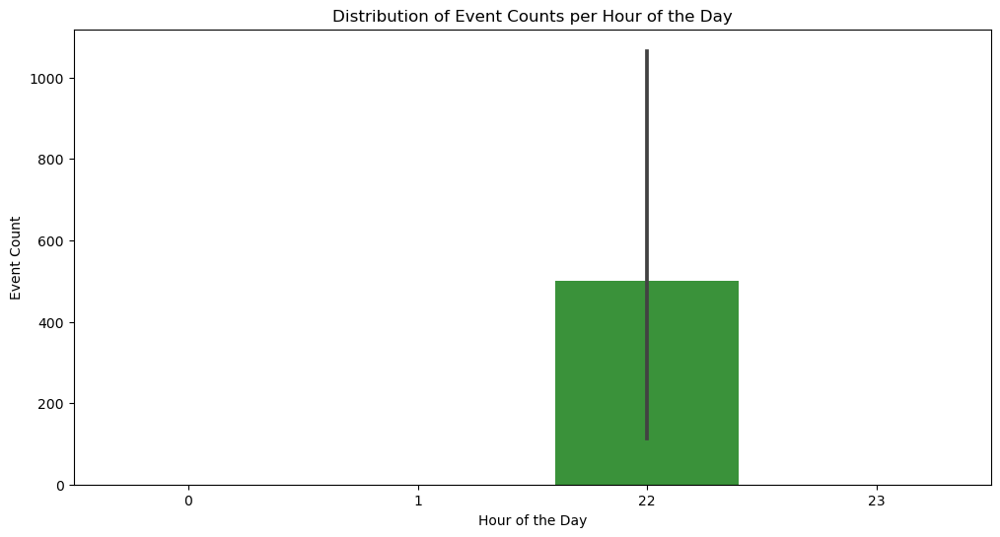

In [37]:
# Visualize the distribution of event counts per hour of the day
plt.figure(figsize=(12, 6))
sns.barplot(x=data['Hour'], y=data.groupby('Hour')['LineId'].count())
plt.xlabel('Hour of the Day')
plt.ylabel('Event Count')
plt.title('Distribution of Event Counts per Hour of the Day')
plt.xticks(rotation=0)
plt.show()


In [38]:
# Calculate the total event count for each component
total_event_count_per_component = data.groupby('Component')['LineId'].count()
total_event_count_per_component

Component
HiH_                            10
HiH_DataStatManager             17
HiH_HiAppUtil                    8
HiH_HiBroadcastUtil              5
HiH_HiHealthBinder               9
HiH_HiHealthDataInsertStore     11
HiH_HiSyncControl               42
HiH_HiSyncUtil                   2
HiH_ListenerManager              2
Step_DataCache                   1
Step_ExtSDM                    482
Step_FlushableStepDataCache      8
Step_HGNH                        2
Step_LSC                       710
Step_NotificationUtil            1
Step_SPUtils                   494
Step_ScreenUtil                  1
Step_StandReportReceiver       171
Step_StandStepCounter           19
Step_StandStepDataManager        5
Name: LineId, dtype: int64

In [39]:
# Identify the Pid with the highest average event count per day
pid_with_highest_avg_event_count = events_per_pid.idxmax()
pid_with_highest_avg_event_count

30002312

In [40]:
# Calculate the median event count per day
median_event_count_per_day = daily_event_distribution.median()
median_event_count_per_day

1000.0

In [41]:
# Calculate the number of unique EventTemplates
unique_event_templates_count = data['EventTemplate'].nunique()
unique_event_templates_count

75

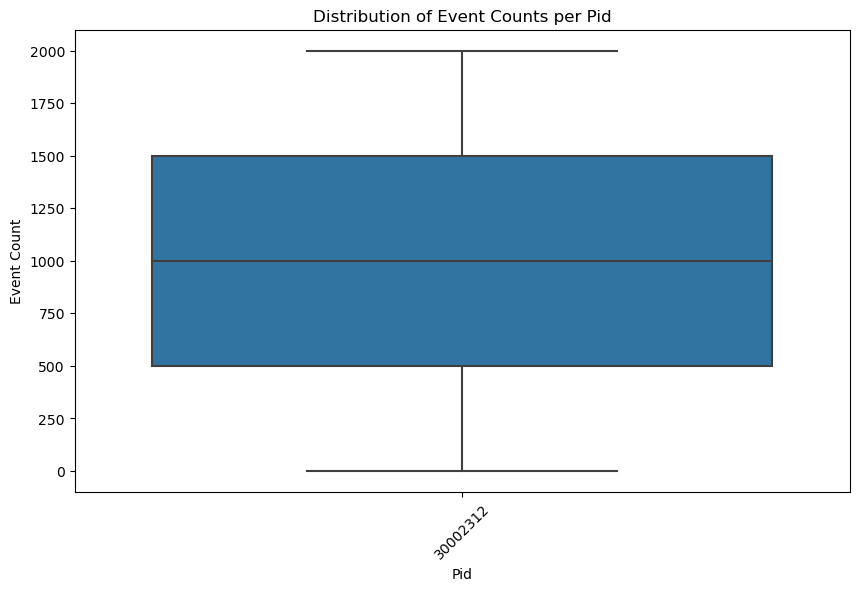

In [42]:
# Visualize the distribution of event counts per Pid
plt.figure(figsize=(10, 6))
sns.boxplot(x='Pid', y='LineId', data=data)
plt.xlabel('Pid')
plt.ylabel('Event Count')
plt.title('Distribution of Event Counts per Pid')
plt.xticks(rotation=45)
plt.show()


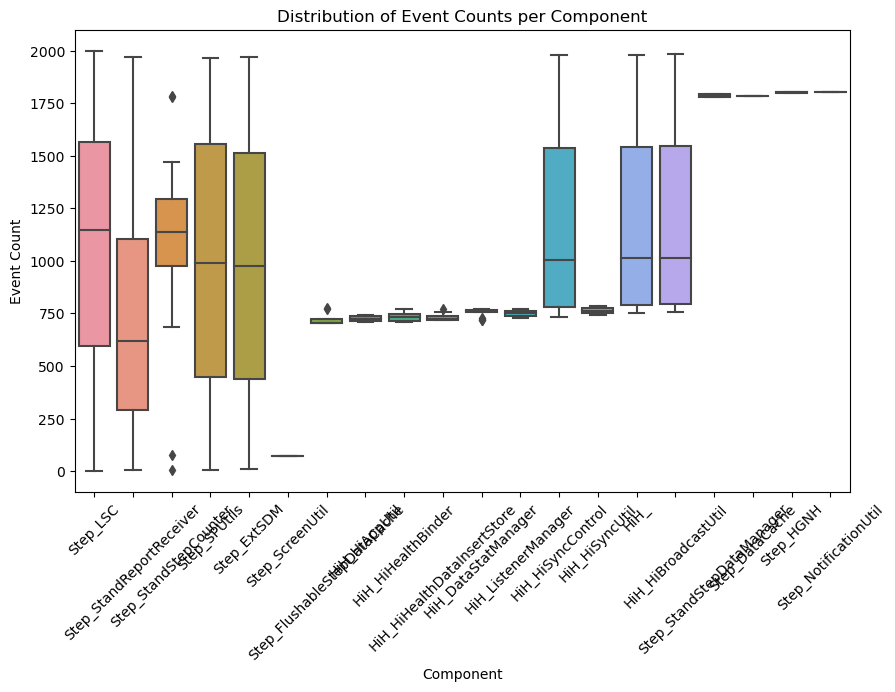

In [43]:
# Visualize the distribution of event counts per component
plt.figure(figsize=(10, 6))
sns.boxplot(x='Component', y='LineId', data=data)
plt.xlabel('Component')
plt.ylabel('Event Count')
plt.title('Distribution of Event Counts per Component')
plt.xticks(rotation=45)
plt.show()


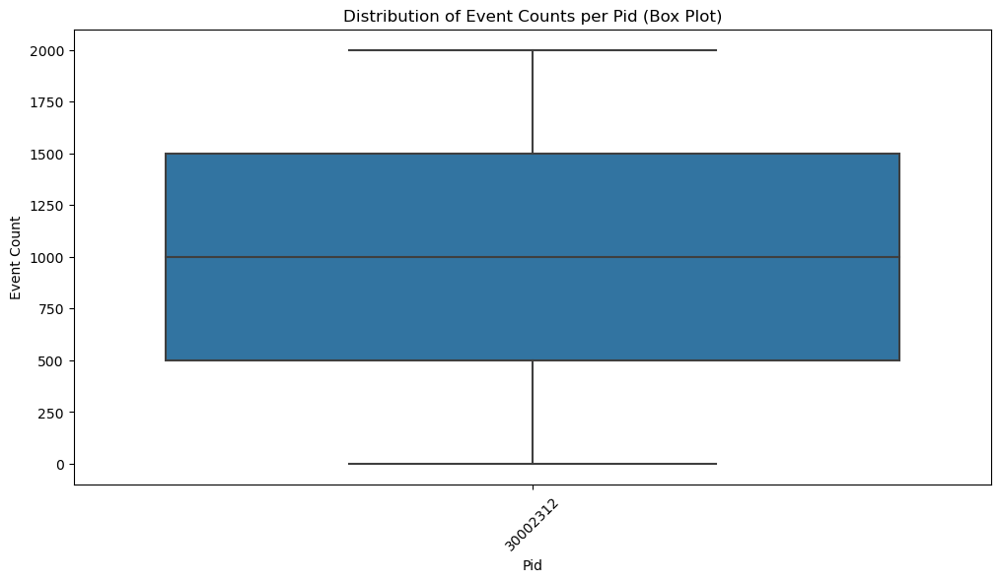

In [44]:
# Visualize the distribution of event counts per Pid with box plots
plt.figure(figsize=(12, 6))
sns.boxplot(x='Pid', y='LineId', data=data)
plt.xlabel('Pid')
plt.ylabel('Event Count')
plt.title('Distribution of Event Counts per Pid (Box Plot)')
plt.xticks(rotation=45)
plt.show()


In [45]:
# Identify the Pid with the longest gap between events
pid_with_longest_gap = data.groupby('Pid')['Time'].diff().max()
pid_with_longest_gap 

Timedelta('0 days 00:04:42.626000')

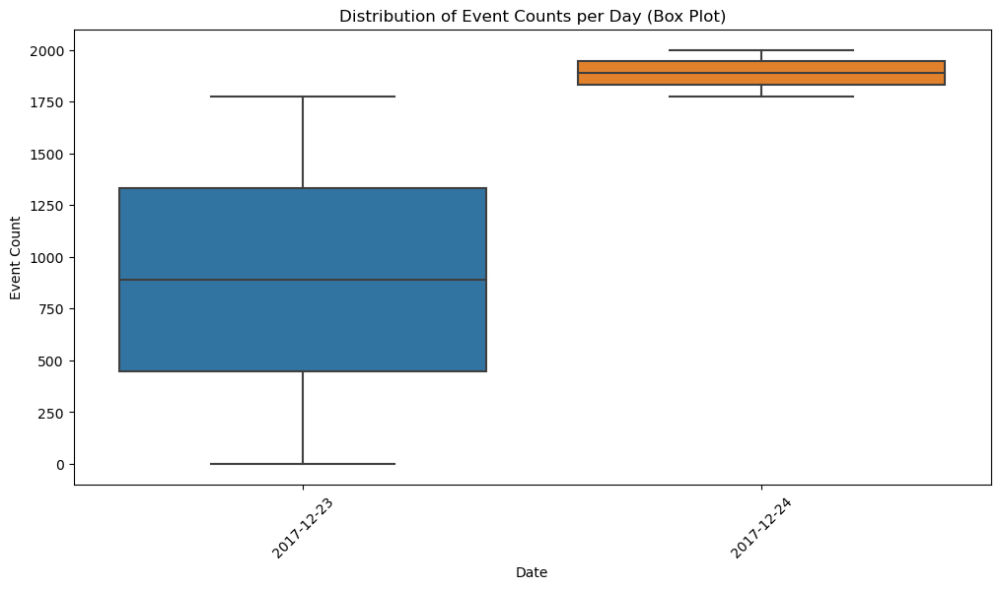

In [46]:
# Visualize the distribution of event counts per day with box plots
plt.figure(figsize=(12, 6))
sns.boxplot(x='Date', y='LineId', data=data)
plt.xlabel('Date')
plt.ylabel('Event Count')
plt.title('Distribution of Event Counts per Day (Box Plot)')
plt.xticks(rotation=45)
plt.show()


In [47]:
# Calculate the average event count per hour of the day
average_event_count_per_hour = data.groupby('Hour')['LineId'].count().mean()
average_event_count_per_hour

500.0

In [48]:
# Identify the Pid with the highest total steps
pid_with_highest_total_steps = data.groupby('Pid')['Steps'].sum().idxmax()
pid_with_highest_total_steps 

30002312

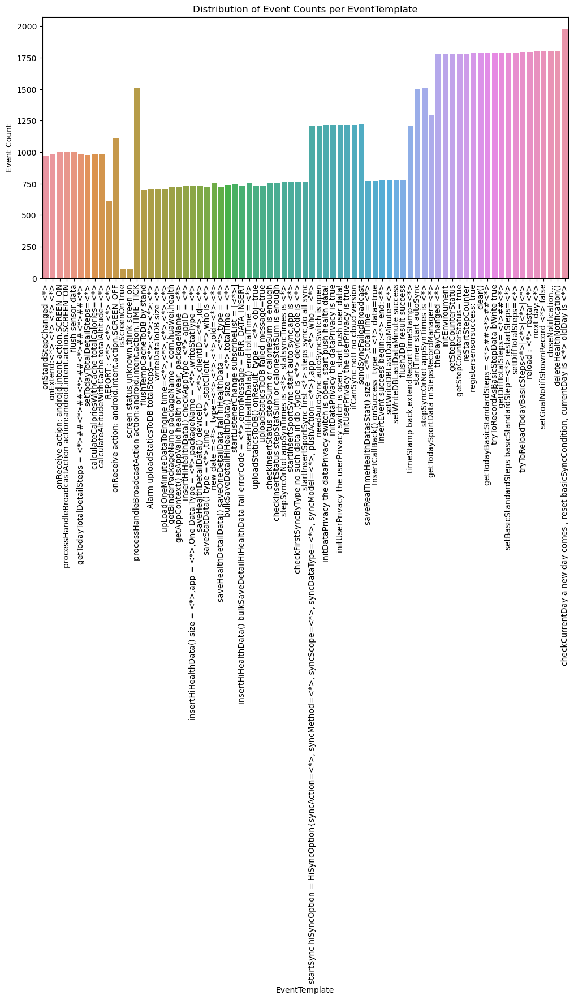

In [49]:
# Visualize the distribution of event counts per EventTemplate
plt.figure(figsize=(12, 6))
sns.barplot(x='EventTemplate', y='LineId', data=data, errorbar=None)
plt.xlabel('EventTemplate')
plt.ylabel('Event Count')
plt.title('Distribution of Event Counts per EventTemplate')
plt.xticks(rotation=90)
plt.show()


In [50]:
# Calculate the average steps per EventTemplate
average_steps_per_event_template = data.groupby('EventTemplate')['Steps'].mean()
average_steps_per_event_template 

EventTemplate
Alarm uploadStaticsToDB totalSteps=<*>:<*>:<*>:<*>        NaN
InsertCallBack() onSuccess  type = <*> data=true          NaN
InsertEvent success begin:<*> end:<*>                     NaN
REPORT : <*> <*> <*> <*>                                  NaN
bulkSaveDetailHiHealthData() size = <*>,totalTime = <*>   NaN
                                                           ..
tryToReloadTodayBasicSteps<*>|<*>|<*>|<*>                 NaN
upLoadOneMinuteDataToEngine time=<*>,<*>,<*>,<*>,<*>      NaN
uploadStaticsToDB failed message=true                     NaN
uploadStaticsToDB() onResult  type = <*> obj=true         NaN
writeDataToDB size <*>                                    NaN
Name: Steps, Length: 75, dtype: float64

In [51]:
# Calculate the average duration of workout sessions in minutes
average_workout_duration_minutes = workout_sessions['Duration'].mean() / 60
average_workout_duration_minutes 

NaT

In [52]:
# Calculate the total event count for each EventTemplate
total_event_count_per_template = data.groupby('EventTemplate')['LineId'].count()
total_event_count_per_template

EventTemplate
Alarm uploadStaticsToDB totalSteps=<*>:<*>:<*>:<*>           1
InsertCallBack() onSuccess  type = <*> data=true             1
InsertEvent success begin:<*> end:<*>                        1
REPORT : <*> <*> <*> <*>                                   136
bulkSaveDetailHiHealthData() size = <*>,totalTime = <*>      2
                                                          ... 
tryToReloadTodayBasicSteps<*>|<*>|<*>|<*>                    1
upLoadOneMinuteDataToEngine time=<*>,<*>,<*>,<*>,<*>         5
uploadStaticsToDB failed message=true                        1
uploadStaticsToDB() onResult  type = <*> obj=true            1
writeDataToDB size <*>                                       1
Name: LineId, Length: 75, dtype: int64

In [53]:
# Calculate the average duration of workout sessions per Pid
average_duration_per_pid = workout_sessions.groupby('Pid')['Duration'].mean()
average_duration_per_pid 

Series([], Name: Duration, dtype: timedelta64[ns])

In [54]:
# Identify the Pid with the least variation in daily step count
pid_with_least_daily_step_variation = data.groupby(['Pid', 'Date'])['Steps'].sum().groupby('Pid').std().idxmin()
pid_with_least_daily_step_variation

30002312

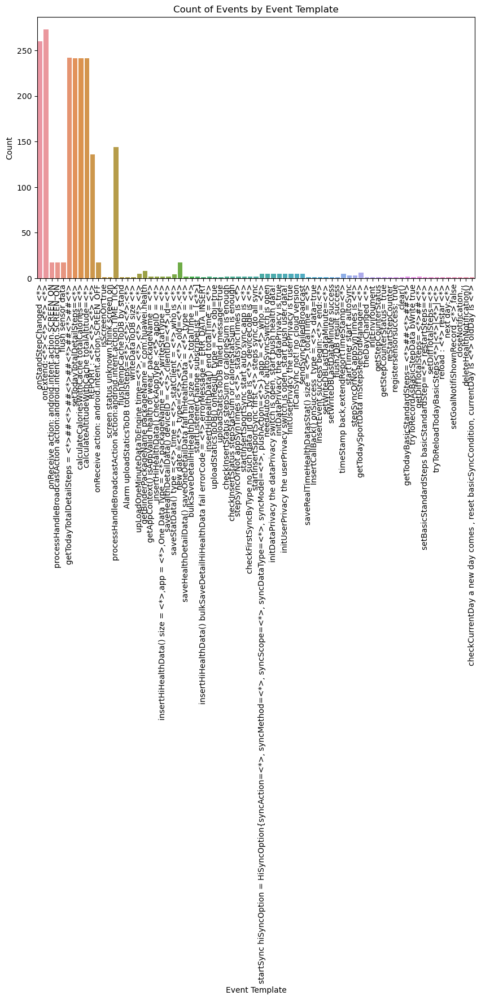

In [55]:
# Countplot of Event Templates
plt.figure(figsize=(10, 6))
sns.countplot(data=data, x='EventTemplate')
plt.title('Count of Events by Event Template')
plt.xlabel('Event Template')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()


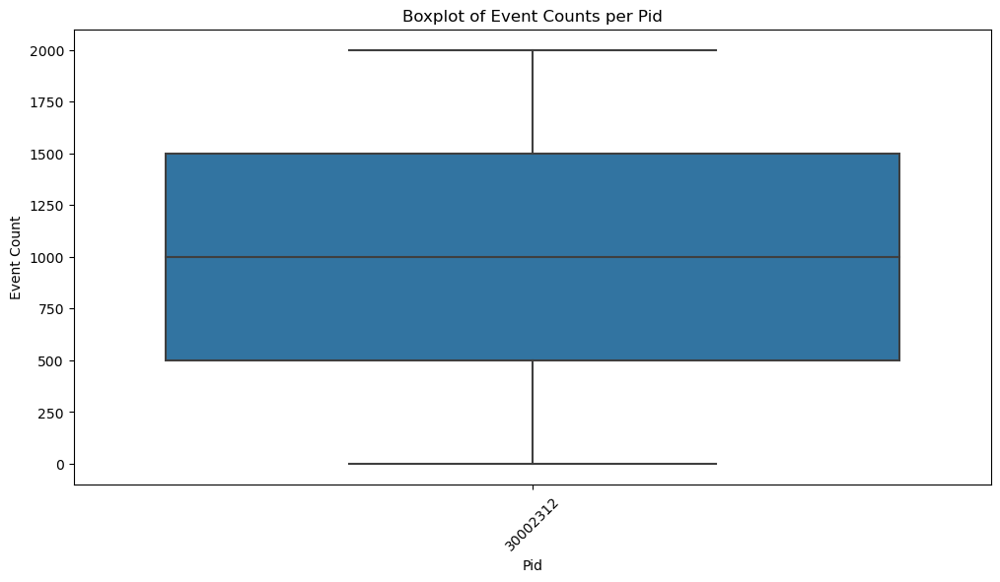

In [56]:
# Boxplot of Event Counts per Pid
plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x='Pid', y='LineId')
plt.title('Boxplot of Event Counts per Pid')
plt.xlabel('Pid')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.show()


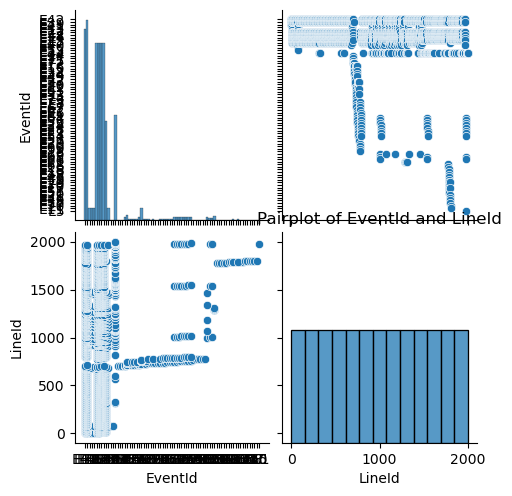

In [57]:
# Pairplot of EventId and LineId
sns.pairplot(data=data, vars=['EventId', 'LineId'])
plt.title('Pairplot of EventId and LineId')
plt.show()


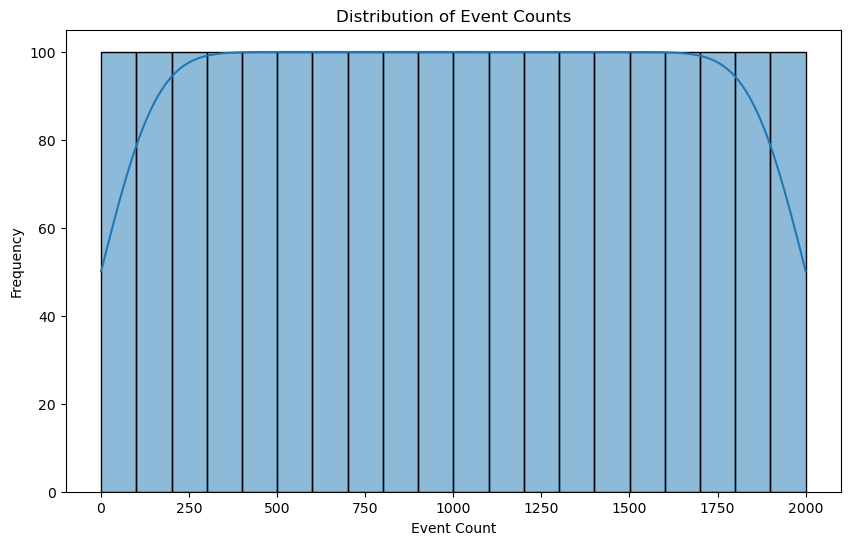

In [58]:
# Distribution of Event Counts
plt.figure(figsize=(10, 6))
sns.histplot(data=data, x='LineId', bins=20, kde=True)
plt.title('Distribution of Event Counts')
plt.xlabel('Event Count')
plt.ylabel('Frequency')
plt.show()


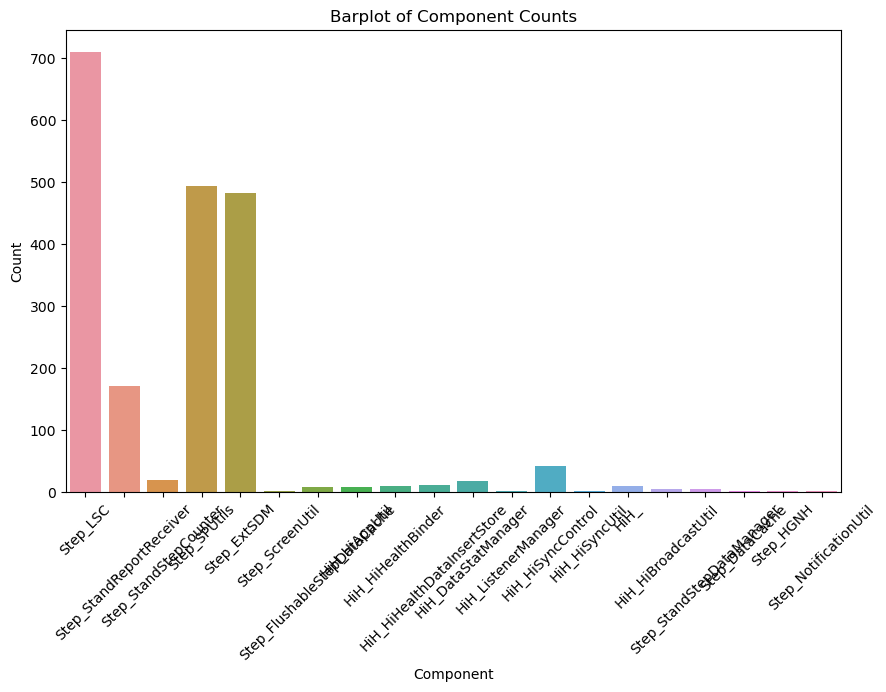

In [59]:
# Barplot of Component Counts
plt.figure(figsize=(10, 6))
sns.barplot(data=data, x='Component', y='LineId', estimator=len)
plt.title('Barplot of Component Counts')
plt.xlabel('Component')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


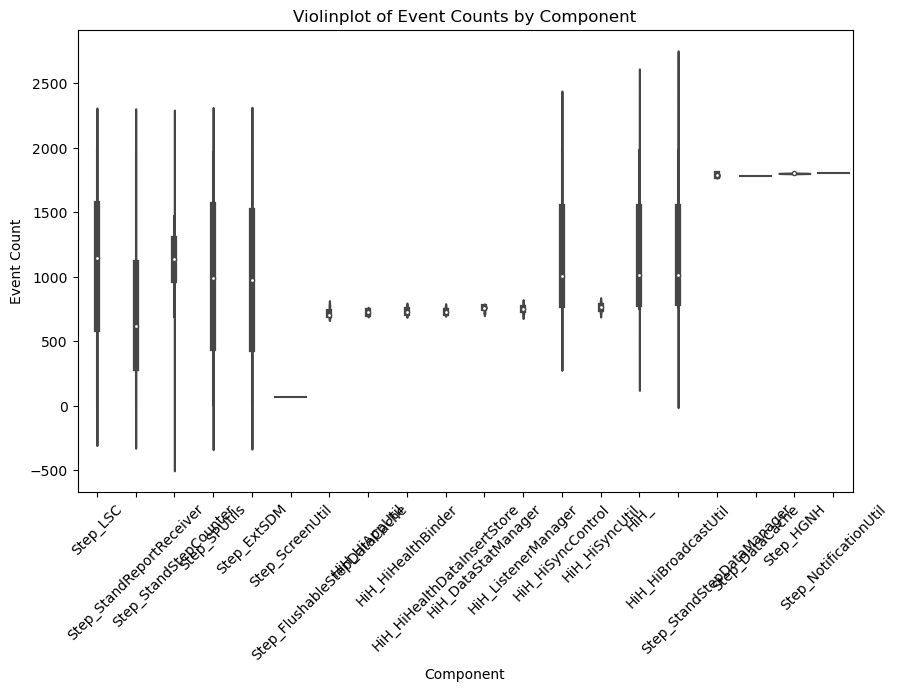

In [60]:
# Violinplot of Event Counts by Component
plt.figure(figsize=(10, 6))
sns.violinplot(data=data, x='Component', y='LineId')
plt.title('Violinplot of Event Counts by Component')
plt.xlabel('Component')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.show()


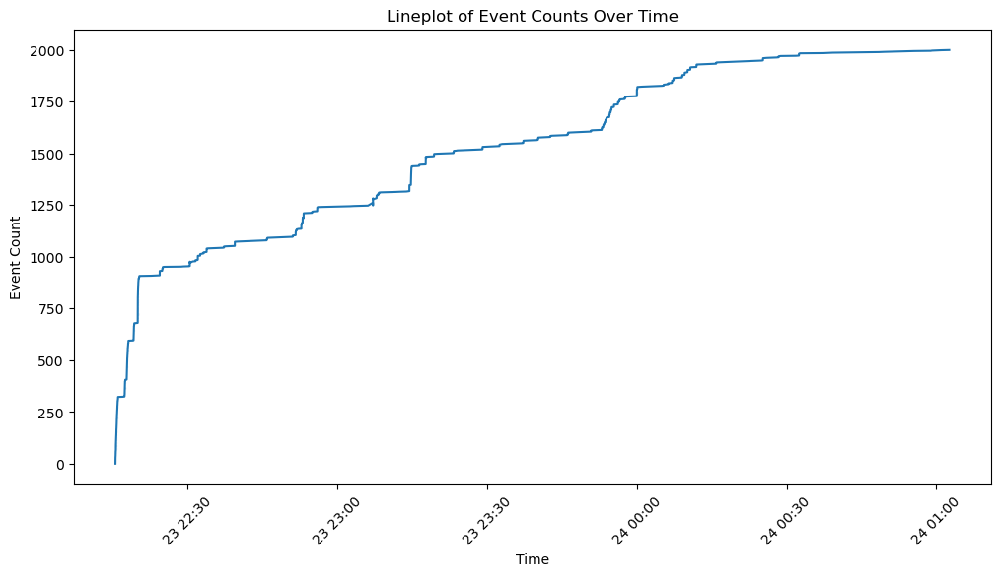

In [61]:
# Lineplot of Event Counts Over Time
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Time', y='LineId')
plt.title('Lineplot of Event Counts Over Time')
plt.xlabel('Time')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.show()


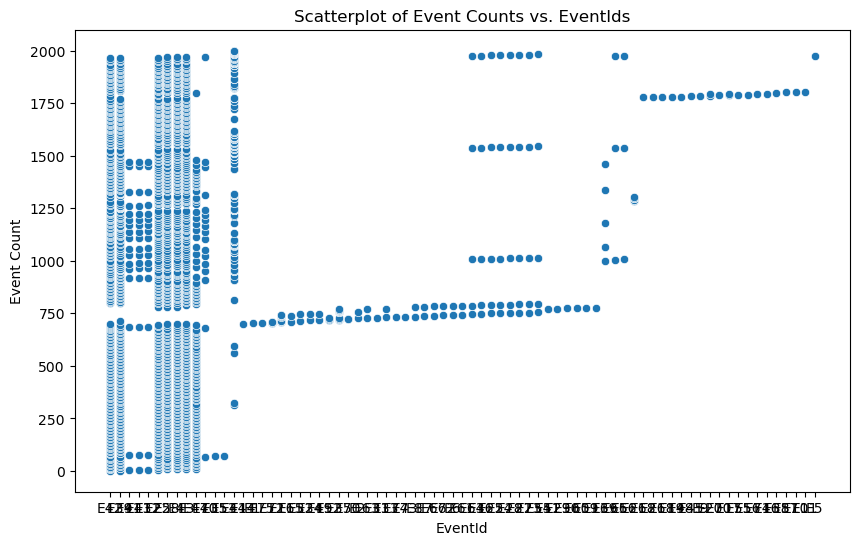

In [62]:
# Scatterplot of Event Counts vs. EventIds
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='EventId', y='LineId')
plt.title('Scatterplot of Event Counts vs. EventIds')
plt.xlabel('EventId')
plt.ylabel('Event Count')
plt.show()


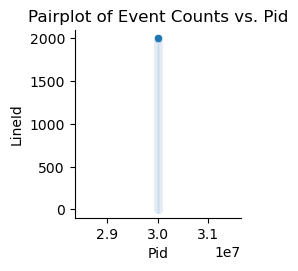

In [63]:
# Pairplot of Event Counts vs. Pid
sns.pairplot(data=data, x_vars=['Pid'], y_vars=['LineId'])
plt.title('Pairplot of Event Counts vs. Pid')
plt.show()


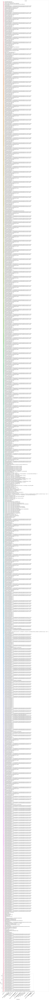

In [64]:
# Barplot of Content Counts by Component
plt.figure(figsize=(10, 6))
sns.barplot(data=data, x='Component', y='LineId', hue='Content', estimator=len)
plt.title('Barplot of Content Counts by Component')
plt.xlabel('Component')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


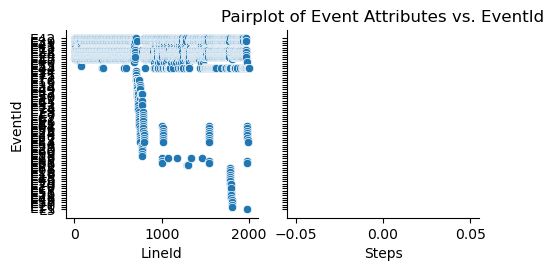

In [65]:
# Pairplot of Event Attributes vs. EventId
sns.pairplot(data=data, x_vars=['LineId', 'Steps'], y_vars=['EventId'], kind='scatter')
plt.title('Pairplot of Event Attributes vs. EventId')
plt.show()


C:\Users\Tejas\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


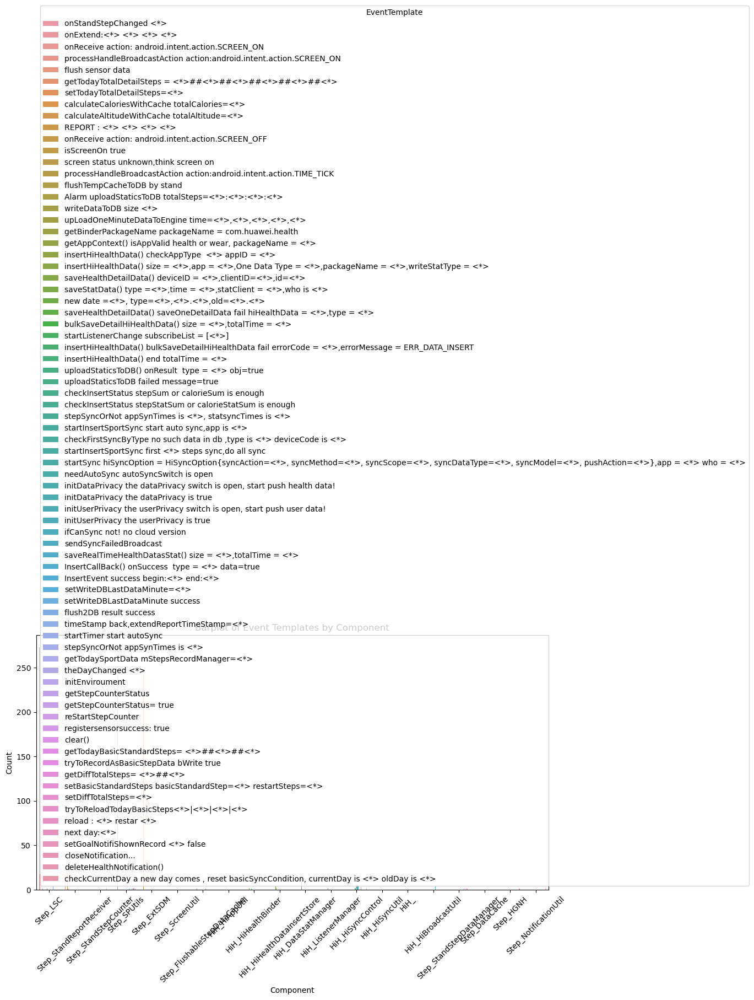

In [66]:
# Barplot of Event Templates by Component
plt.figure(figsize=(12, 6))
sns.barplot(data=data, x='Component', y='LineId', hue='EventTemplate', estimator=len)
plt.title('Barplot of Event Templates by Component')
plt.xlabel('Component')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='EventTemplate')
plt.show()


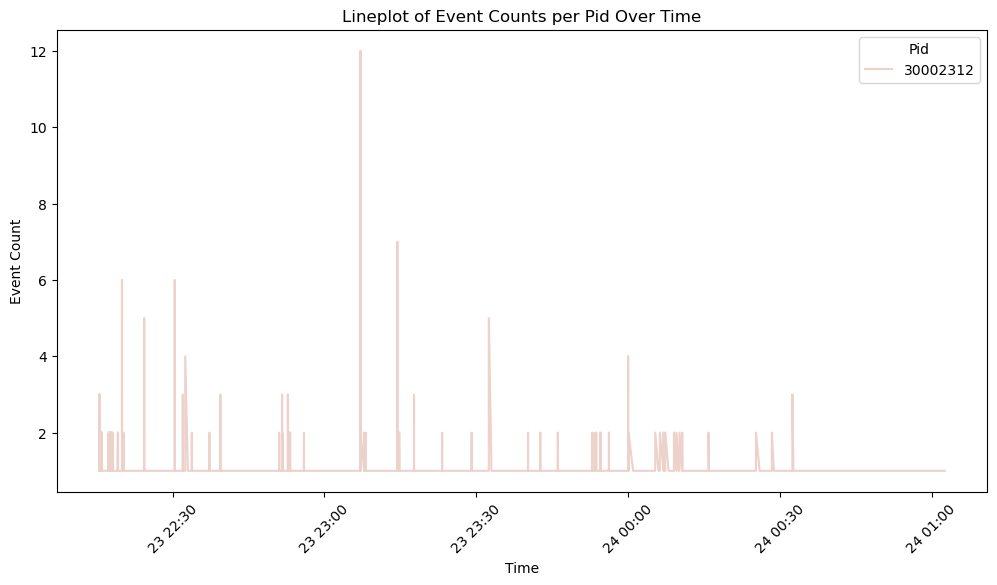

In [67]:
# Lineplot of Event Counts per Pid Over Time
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Time', y='LineId', hue='Pid', estimator=len)
plt.title('Lineplot of Event Counts per Pid Over Time')
plt.xlabel('Time')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='Pid')
plt.show()


C:\Users\Tejas\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


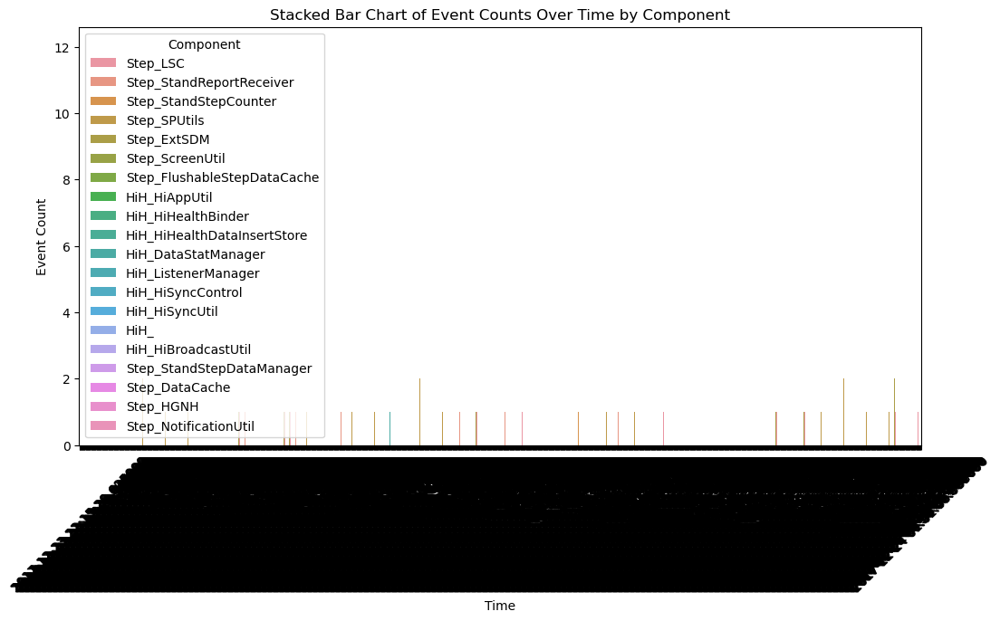

In [68]:
# Stacked Bar Chart of Event Counts Over Time by Component
plt.figure(figsize=(12, 6))
sns.barplot(data=data, x='Time', y='LineId', hue='Component', estimator=len)
plt.title('Stacked Bar Chart of Event Counts Over Time by Component')
plt.xlabel('Time')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='Component')
plt.show()


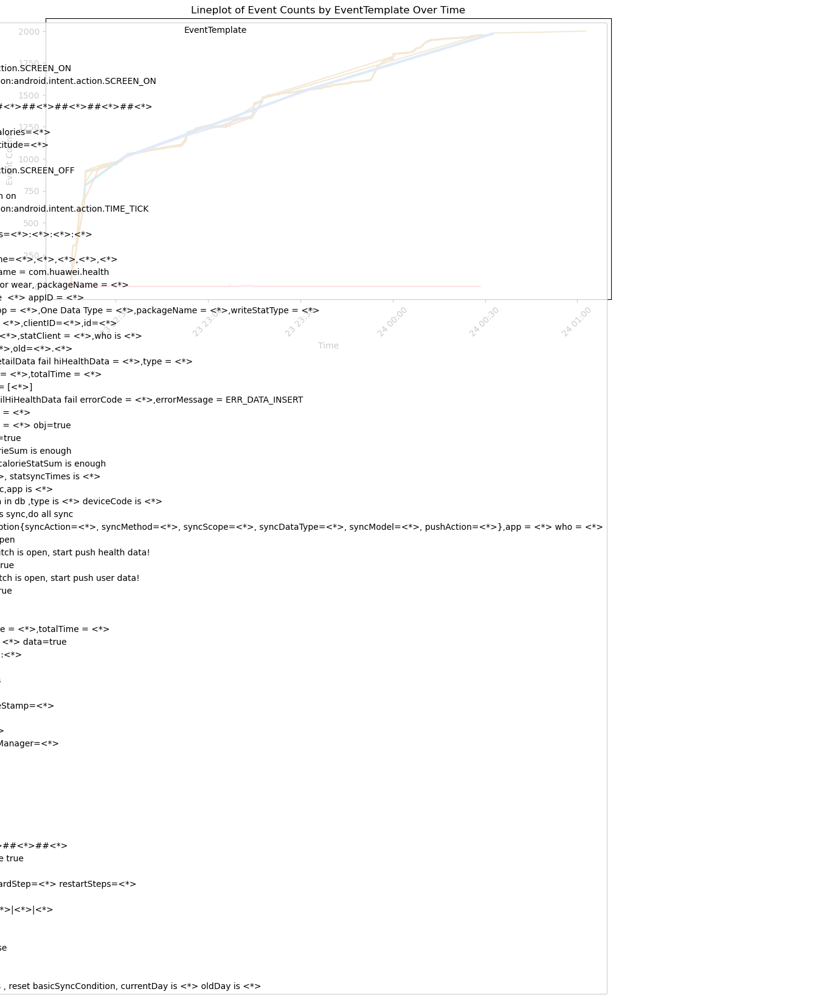

In [69]:
# Lineplot of Event Counts by EventTemplate Over Time
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Time', y='LineId', hue='EventTemplate', estimator=len)
plt.title('Lineplot of Event Counts by EventTemplate Over Time')
plt.xlabel('Time')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='EventTemplate')
plt.show()


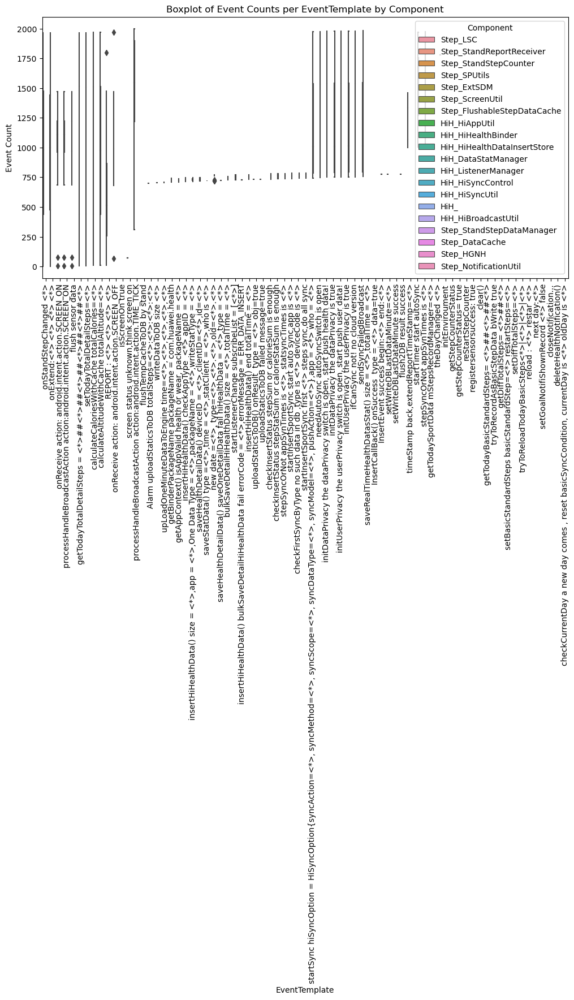

In [70]:
# Boxplot of Event Counts per EventTemplate by Component
plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x='EventTemplate', y='LineId', hue='Component')
plt.title('Boxplot of Event Counts per EventTemplate by Component')
plt.xlabel('EventTemplate')
plt.ylabel('Event Count')
plt.xticks(rotation=90)
plt.legend(title='Component')
plt.show()


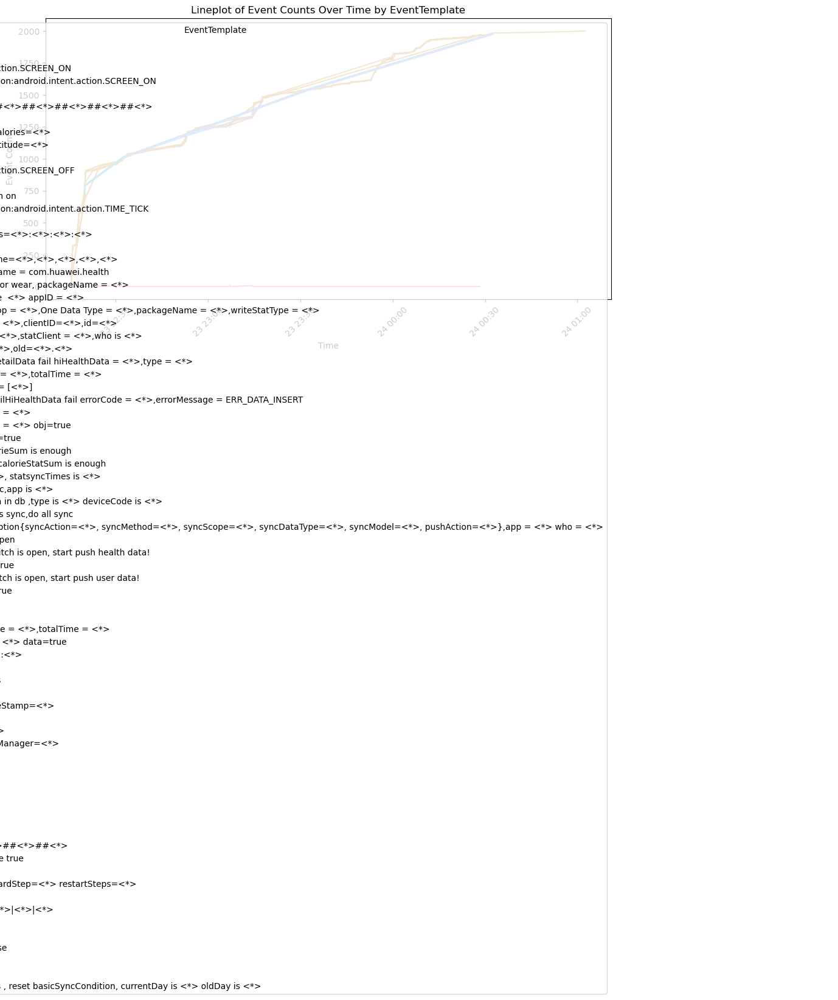

In [71]:
# Lineplot of Event Counts Over Time by EventTemplate
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Time', y='LineId', hue='EventTemplate', estimator=len)
plt.title('Lineplot of Event Counts Over Time by EventTemplate')
plt.xlabel('Time')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='EventTemplate')
plt.show()


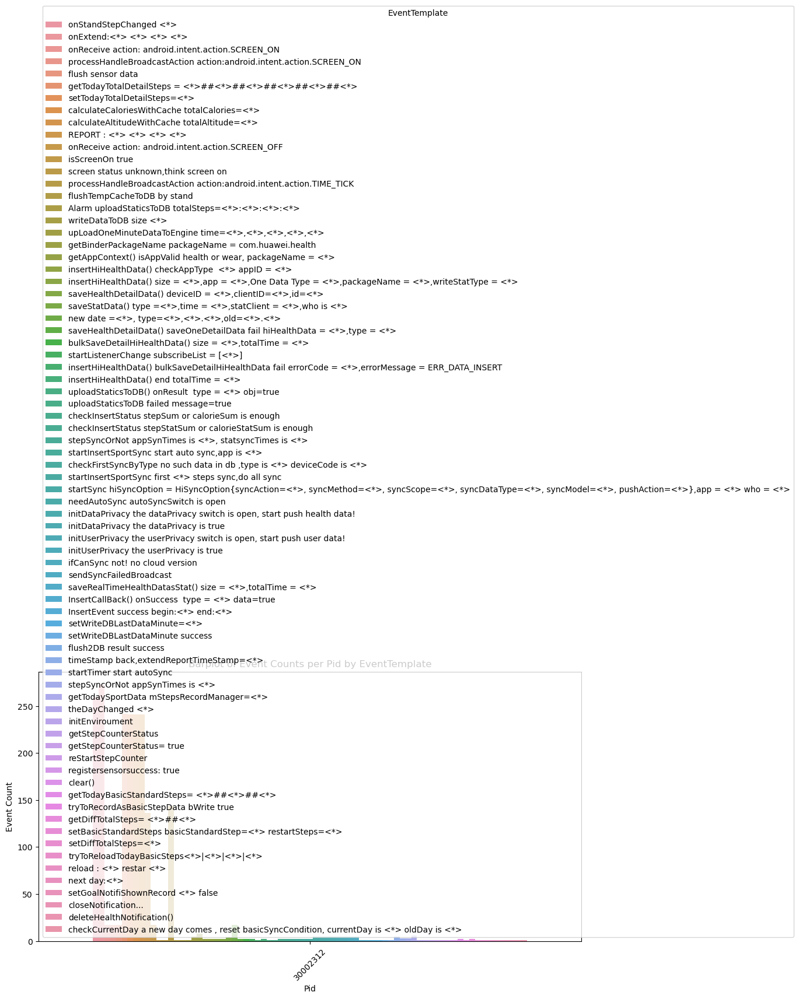

In [72]:
# Barplot of Event Counts per Pid by EventTemplate
plt.figure(figsize=(12, 6))
sns.barplot(data=data, x='Pid', y='LineId', hue='EventTemplate', estimator=len)
plt.title('Barplot of Event Counts per Pid by EventTemplate')
plt.xlabel('Pid')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='EventTemplate')
plt.show()


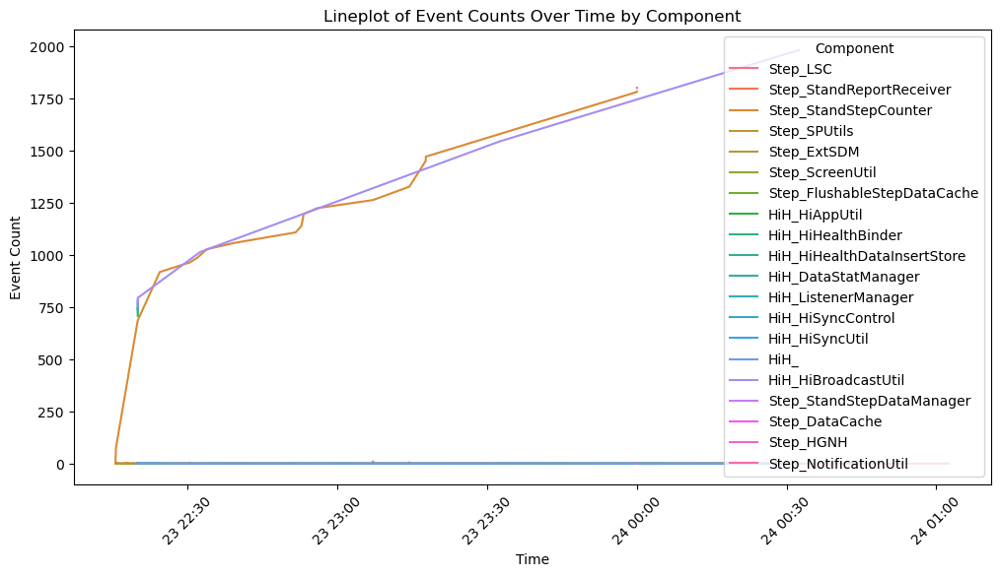

In [73]:
# Lineplot of Event Counts Over Time by Component
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Time', y='LineId', hue='Component', estimator=len)
plt.title('Lineplot of Event Counts Over Time by Component')
plt.xlabel('Time')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='Component')
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


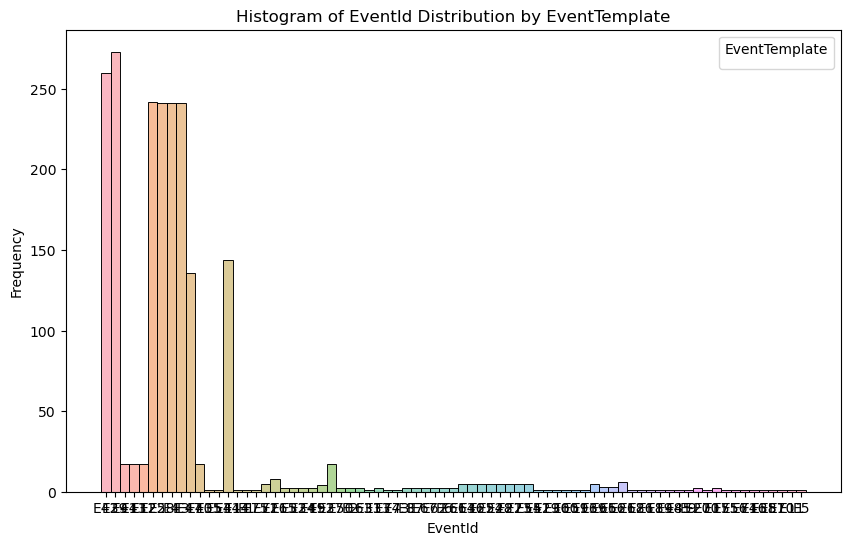

In [74]:
# Histogram of EventId Distribution by EventTemplate
plt.figure(figsize=(10, 6))
sns.histplot(data=data, x='EventId', bins=20, kde=True, hue='EventTemplate')
plt.title('Histogram of EventId Distribution by EventTemplate')
plt.xlabel('EventId')
plt.ylabel('Frequency')
plt.legend(title='EventTemplate')
plt.show()


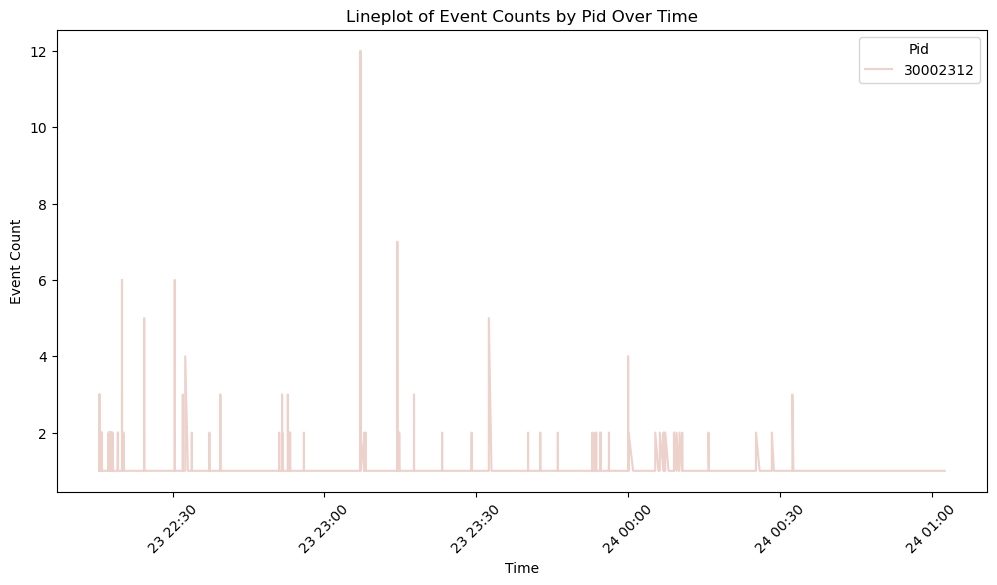

In [75]:
# Lineplot of Event Counts by Pid Over Time
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Time', y='LineId', hue='Pid', estimator=len)
plt.title('Lineplot of Event Counts by Pid Over Time')
plt.xlabel('Time')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='Pid')
plt.show()


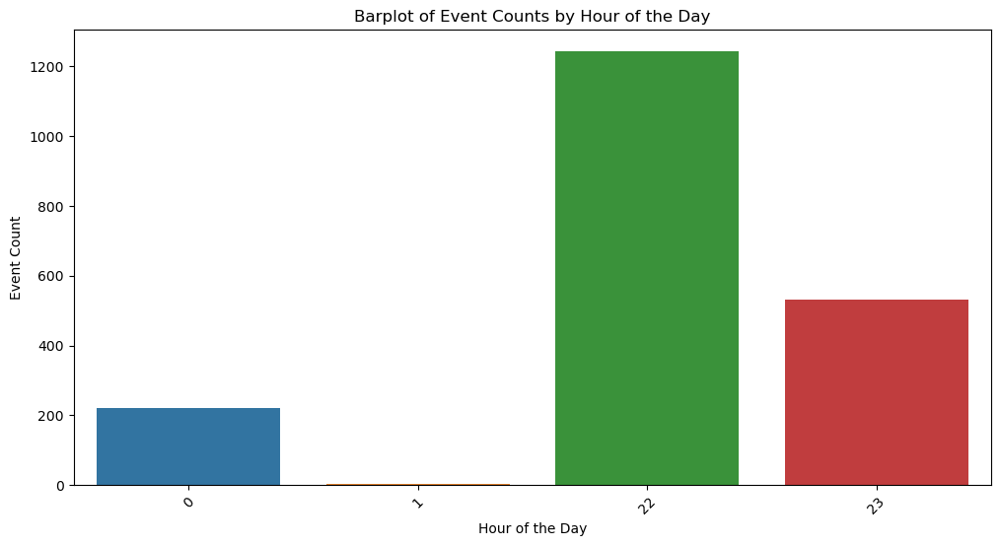

In [76]:
# Barplot of Event Counts by Hour of the Day
hourly_event_counts = data.groupby(data['Time'].dt.hour)['LineId'].count()
plt.figure(figsize=(12, 6))
sns.barplot(x=hourly_event_counts.index, y=hourly_event_counts.values)
plt.title('Barplot of Event Counts by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.show()


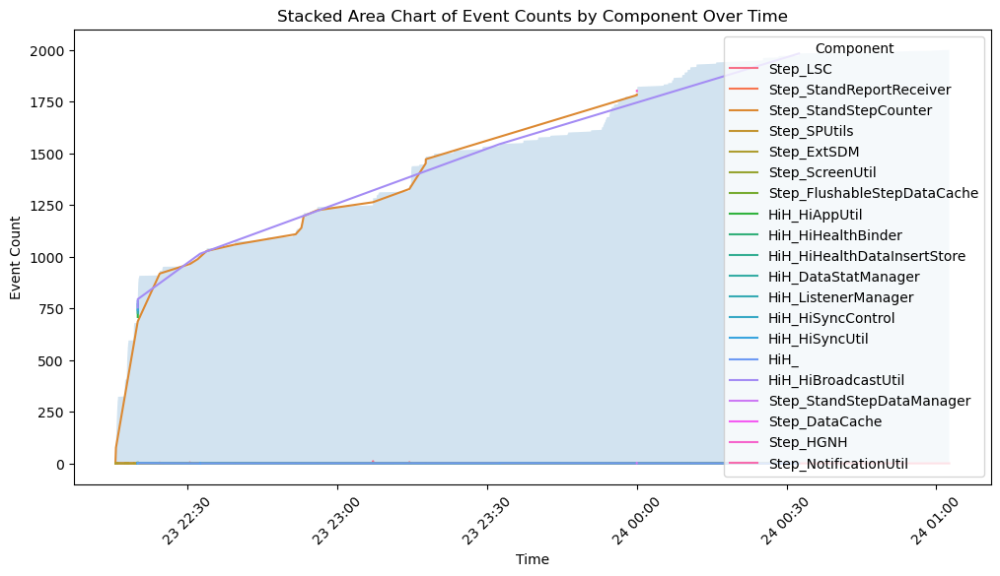

In [77]:
# Stacked Area Chart of Event Counts by Component Over Time
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Time', y='LineId', hue='Component', estimator=len, errorbar=None)
plt.fill_between(data['Time'], data['LineId'], alpha=0.2)
plt.title('Stacked Area Chart of Event Counts by Component Over Time')
plt.xlabel('Time')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='Component')
plt.show()


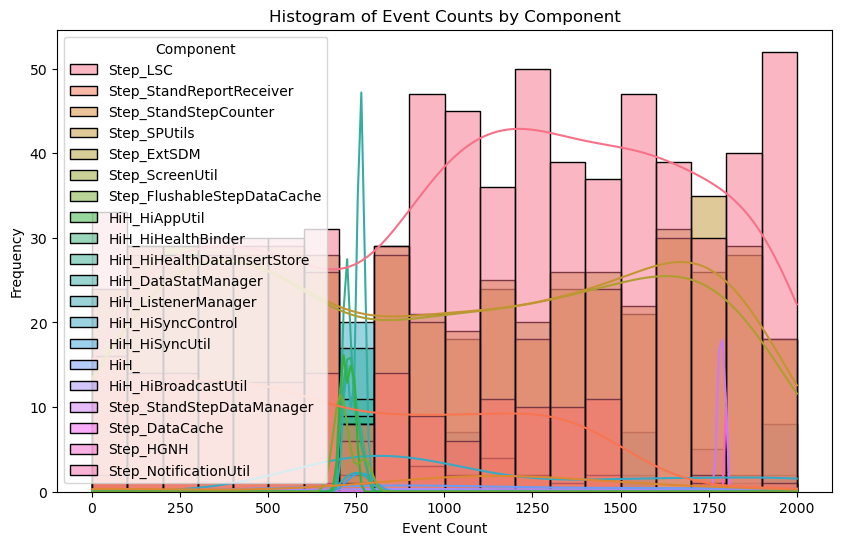

In [78]:
# Histogram of Event Counts by Component
plt.figure(figsize=(10, 6))
sns.histplot(data=data, x='LineId', bins=20, kde=True, hue='Component')
plt.title('Histogram of Event Counts by Component')
plt.xlabel('Event Count')
plt.ylabel('Frequency')
plt.show()


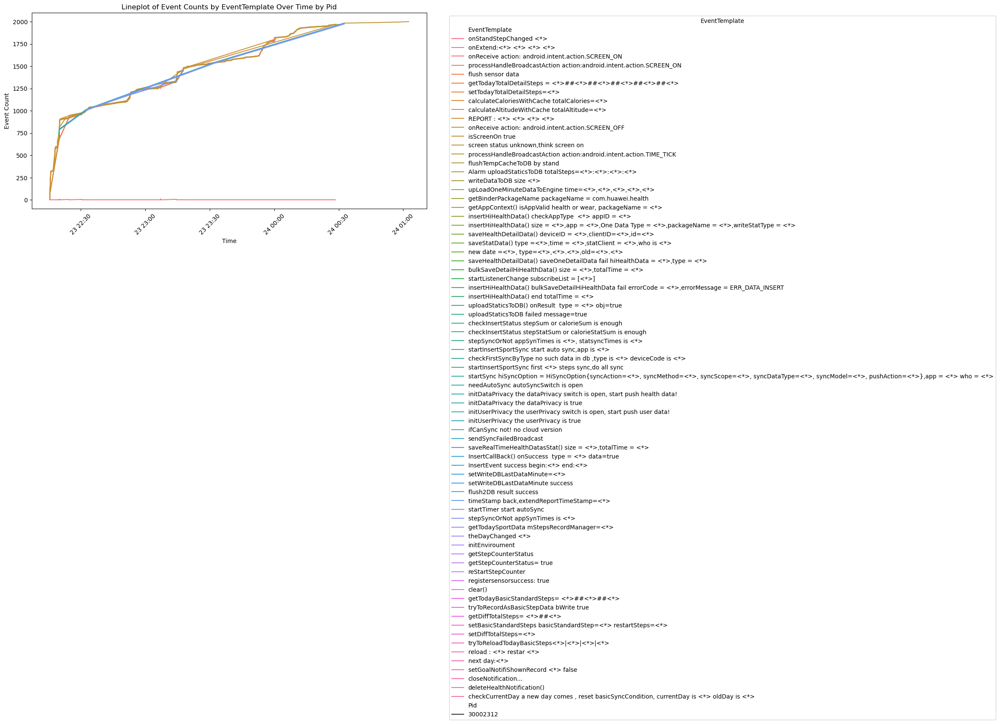

In [79]:
# Lineplot of Event Counts by EventTemplate Over Time by Pid
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Time', y='LineId', hue='EventTemplate', style='Pid', estimator=len)
plt.title('Lineplot of Event Counts by EventTemplate Over Time by Pid')
plt.xlabel('Time')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='EventTemplate', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


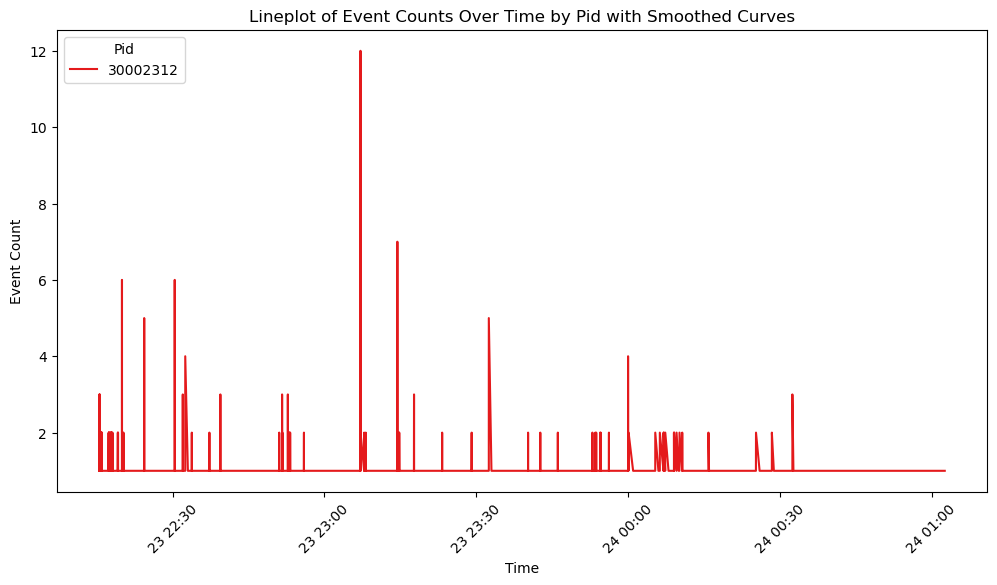

In [80]:
# Lineplot of Event Counts Over Time by Pid with Smoothed Curves
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Time', y='LineId', hue='Pid', estimator=len, errorbar=None, palette='Set1')
plt.title('Lineplot of Event Counts Over Time by Pid with Smoothed Curves')
plt.xlabel('Time')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='Pid', loc='upper left')
plt.show()


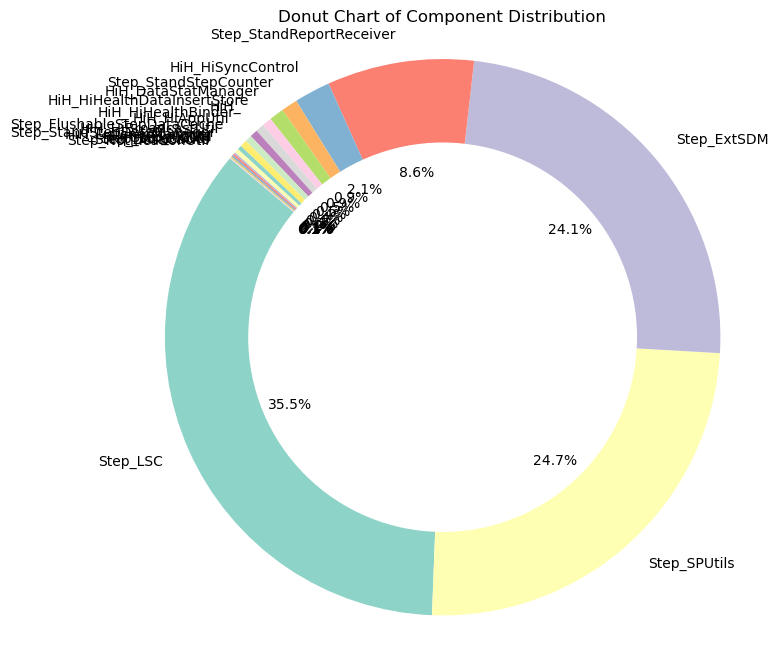

In [81]:
# Donut Chart of Component Distribution
component_counts = data['Component'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(component_counts, labels=component_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set3'))
plt.title('Donut Chart of Component Distribution')
plt.gca().add_artist(plt.Circle((0, 0), 0.70, fc='white'))
plt.axis('equal')
plt.show()


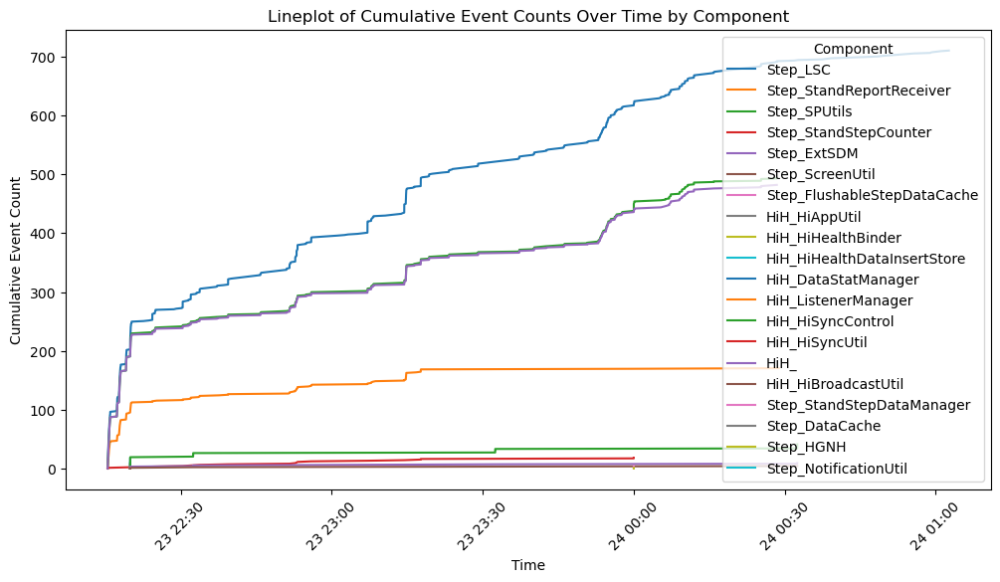

In [82]:
# Lineplot of Cumulative Event Counts Over Time by Component
plt.figure(figsize=(12, 6))
cumulative_counts = data.groupby(['Time', 'Component'])['LineId'].count().groupby('Component').cumsum().reset_index()
sns.lineplot(data=cumulative_counts, x='Time', y='LineId', hue='Component', palette='tab10')
plt.title('Lineplot of Cumulative Event Counts Over Time by Component')
plt.xlabel('Time')
plt.ylabel('Cumulative Event Count')
plt.xticks(rotation=45)
plt.legend(title='Component')
plt.show()


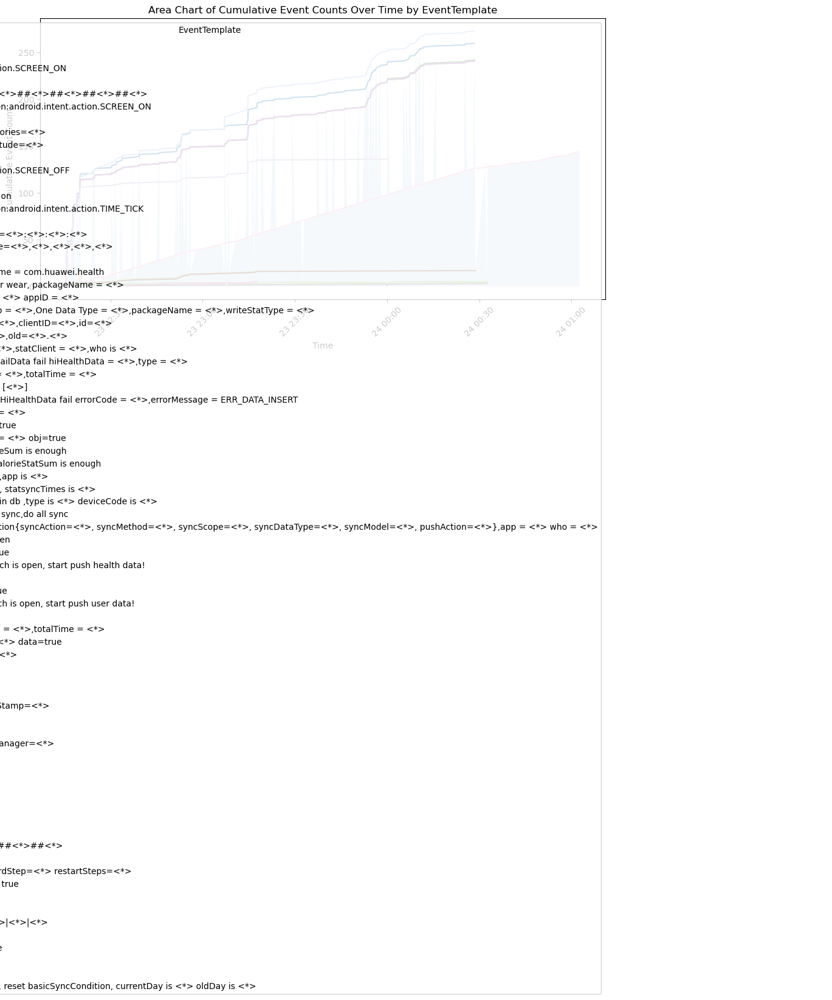

In [83]:
# Area Chart of Cumulative Event Counts Over Time by EventTemplate
plt.figure(figsize=(12, 6))
cumulative_counts_template = data.groupby(['Time', 'EventTemplate'])['LineId'].count().groupby('EventTemplate').cumsum().reset_index()
sns.lineplot(data=cumulative_counts_template, x='Time', y='LineId', hue='EventTemplate', palette='tab20')
plt.fill_between(cumulative_counts_template['Time'], cumulative_counts_template['LineId'], alpha=0.2)
plt.title('Area Chart of Cumulative Event Counts Over Time by EventTemplate')
plt.xlabel('Time')
plt.ylabel('Cumulative Event Count')
plt.xticks(rotation=45)
plt.legend(title='EventTemplate')
plt.show()


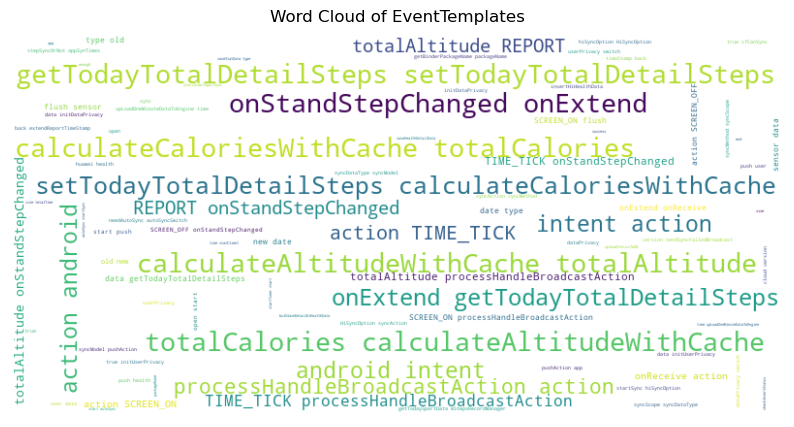

In [84]:
# Word Cloud of EventTemplates
from wordcloud import WordCloud

event_templates_text = " ".join(event for event in data['EventTemplate'])
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(event_templates_text)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of EventTemplates')
plt.show()


C:\Users\Tejas\anaconda3\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 59.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Tejas\anaconda3\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 46.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Tejas\anaconda3\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 44.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Tejas\anaconda3\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 12.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Tejas\anaconda3\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 22.2% of the points

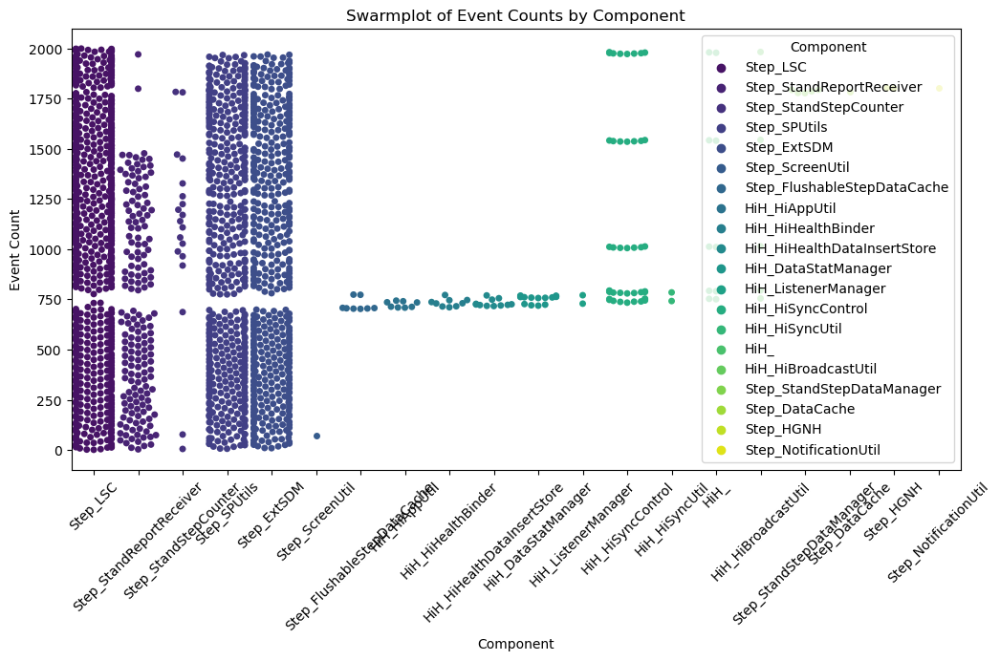

In [85]:
# Swarmplot of Event Counts by Component
plt.figure(figsize=(12, 6))
sns.swarmplot(data=data, x='Component', y='LineId', hue='Component', palette='viridis')
plt.title('Swarmplot of Event Counts by Component')
plt.xlabel('Component')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='Component')
plt.show()


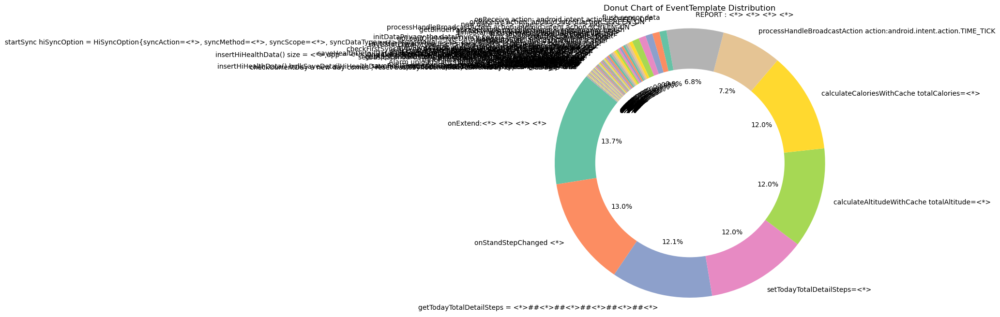

In [86]:
# Donut Chart of EventTemplate Distribution
event_template_counts = data['EventTemplate'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(event_template_counts, labels=event_template_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set2'))
plt.title('Donut Chart of EventTemplate Distribution')
plt.gca().add_artist(plt.Circle((0, 0), 0.70, fc='white'))
plt.axis('equal')
plt.show()


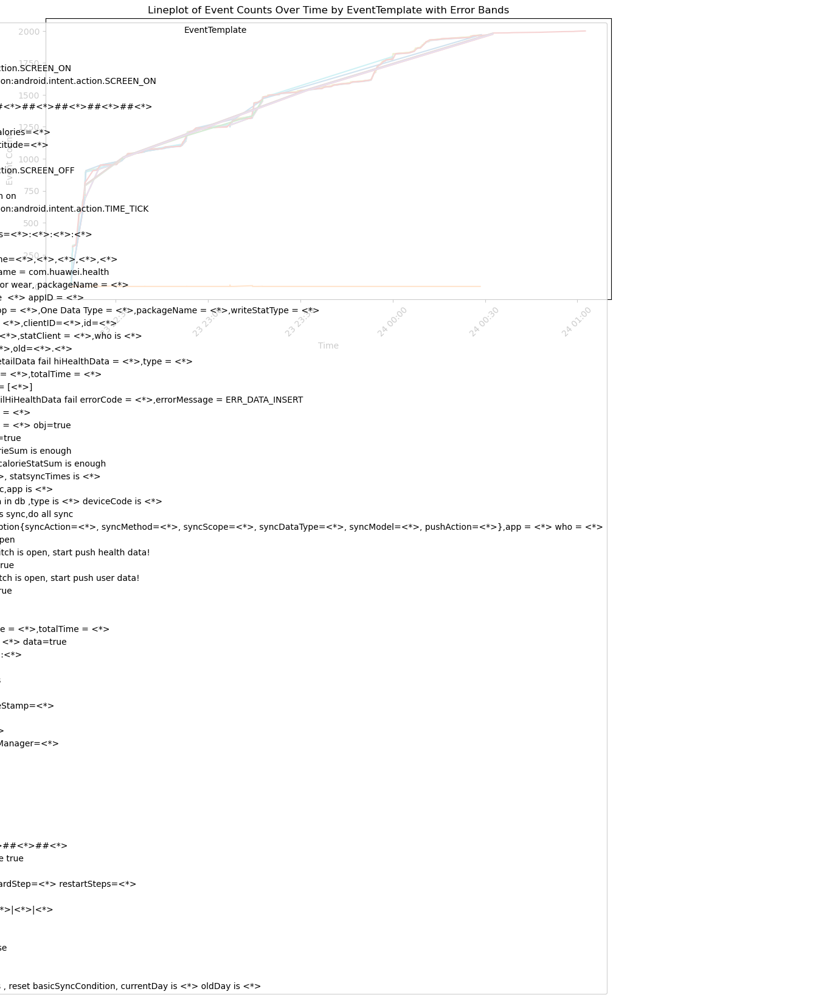

In [87]:
# Lineplot of Event Counts Over Time by EventTemplate with Error Bands
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Time', y='LineId', hue='EventTemplate', estimator=len, errorbar='sd', palette='tab10')
plt.title('Lineplot of Event Counts Over Time by EventTemplate with Error Bands')
plt.xlabel('Time')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='EventTemplate')
plt.show()


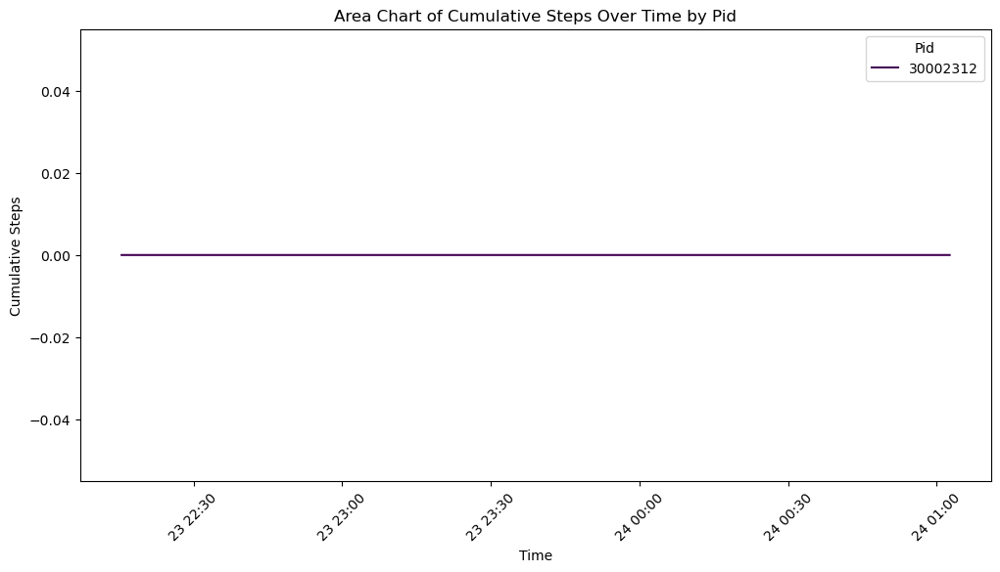

In [88]:
# Area Chart of Cumulative Steps Over Time by Pid
plt.figure(figsize=(12, 6))
cumulative_steps_pid = data.groupby(['Time', 'Pid'])['Steps'].sum().groupby('Pid').cumsum().reset_index()
sns.lineplot(data=cumulative_steps_pid, x='Time', y='Steps', hue='Pid', palette='viridis')
plt.fill_between(cumulative_steps_pid['Time'], cumulative_steps_pid['Steps'], alpha=0.2)
plt.title('Area Chart of Cumulative Steps Over Time by Pid')
plt.xlabel('Time')
plt.ylabel('Cumulative Steps')
plt.xticks(rotation=45)
plt.legend(title='Pid')
plt.show()


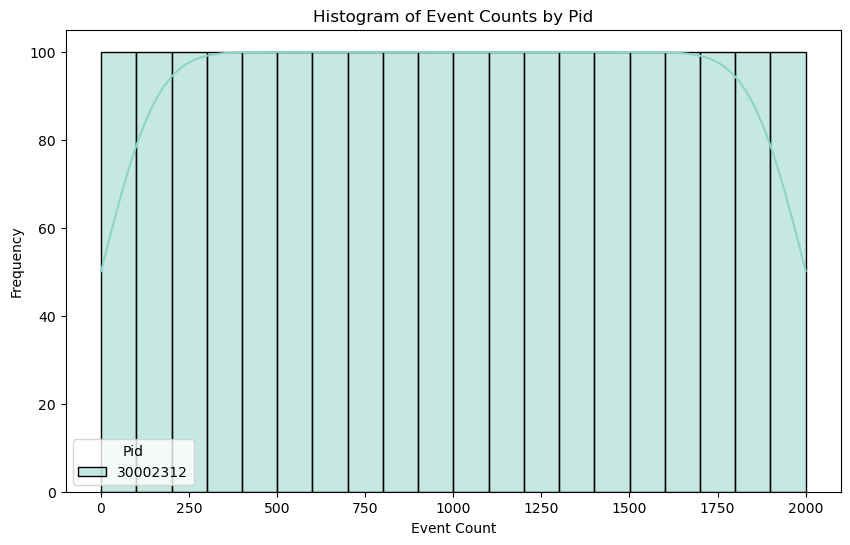

In [89]:
# Histogram of Event Counts by Pid
plt.figure(figsize=(10, 6))
sns.histplot(data=data, x='LineId', bins=20, kde=True, hue='Pid', palette='Set3')
plt.title('Histogram of Event Counts by Pid')
plt.xlabel('Event Count')
plt.ylabel('Frequency')
plt.show()


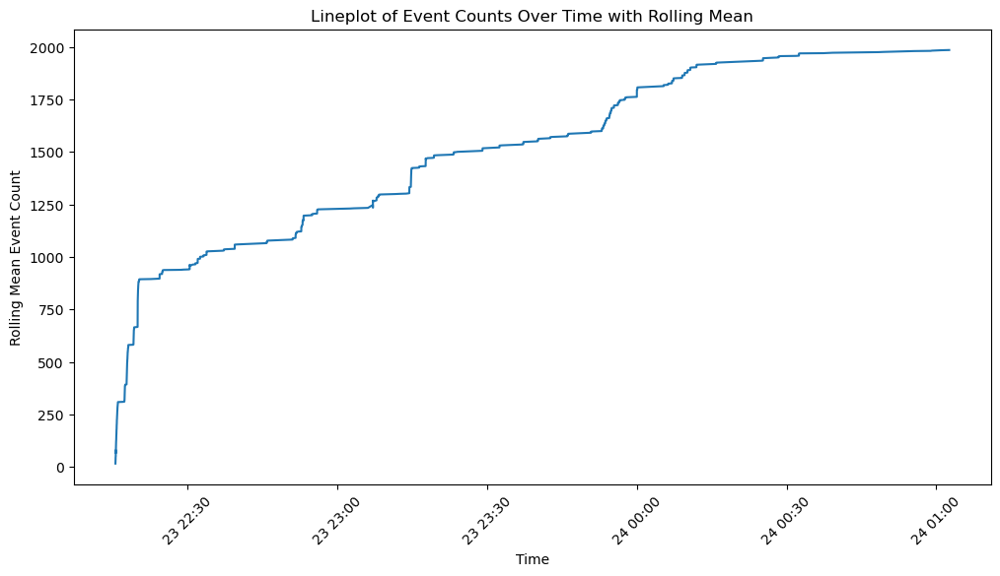

In [90]:
# Lineplot of Event Counts Over Time with Rolling Mean
rolling_mean = data['LineId'].rolling(window=30).mean()
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Time', y=rolling_mean, estimator=None, errorbar=None)
plt.title('Lineplot of Event Counts Over Time with Rolling Mean')
plt.xlabel('Time')
plt.ylabel('Rolling Mean Event Count')
plt.xticks(rotation=45)
plt.show()


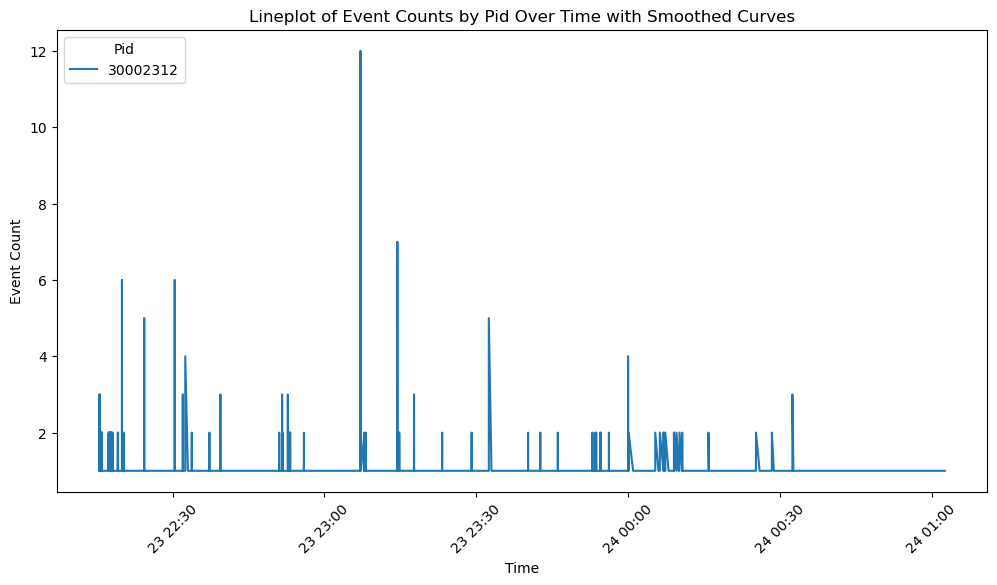

In [91]:
# Lineplot of Event Counts by Pid Over Time with Smoothed Curves
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Time', y='LineId', hue='Pid', estimator=len, errorbar=None, palette='tab20')
plt.title('Lineplot of Event Counts by Pid Over Time with Smoothed Curves')
plt.xlabel('Time')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='Pid', loc='upper left')
plt.show()


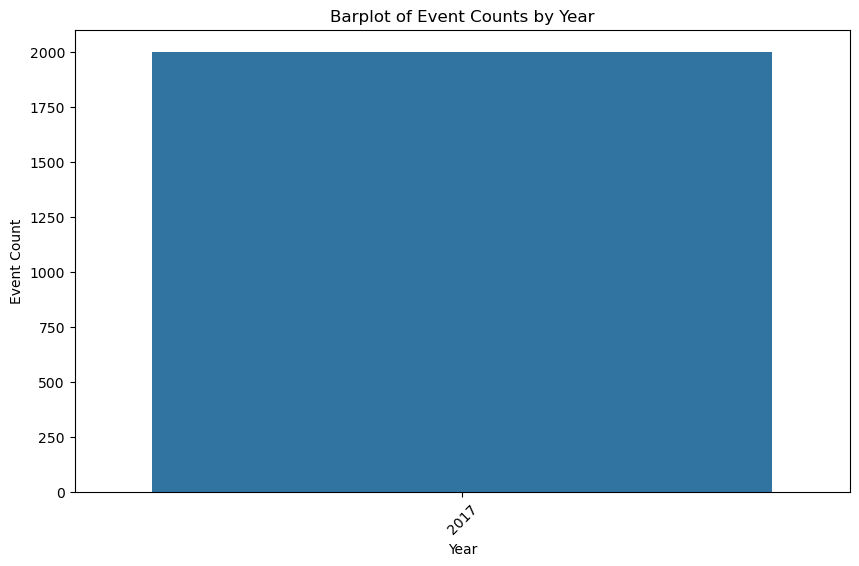

In [92]:
# Barplot of Event Counts by Year
yearly_event_counts = data.groupby(data['Time'].dt.year)['LineId'].count()
plt.figure(figsize=(10, 6))
sns.barplot(x=yearly_event_counts.index, y=yearly_event_counts.values)
plt.title('Barplot of Event Counts by Year')
plt.xlabel('Year')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.show()


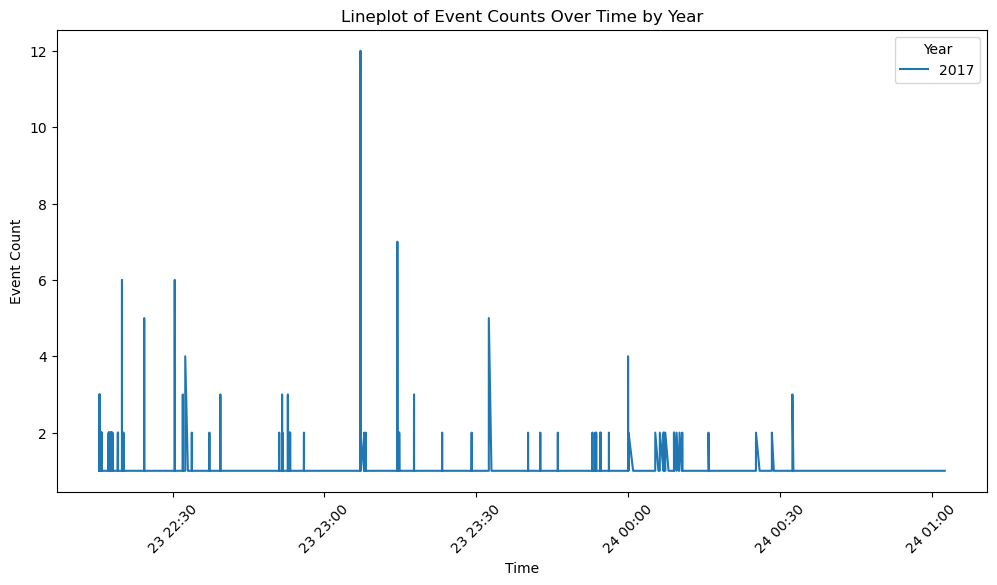

In [93]:
# Lineplot of Event Counts Over Time by Year
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Time', y='LineId', hue=data['Time'].dt.year, estimator=len, errorbar=None, palette='tab10')
plt.title('Lineplot of Event Counts Over Time by Year')
plt.xlabel('Time')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='Year')
plt.show()


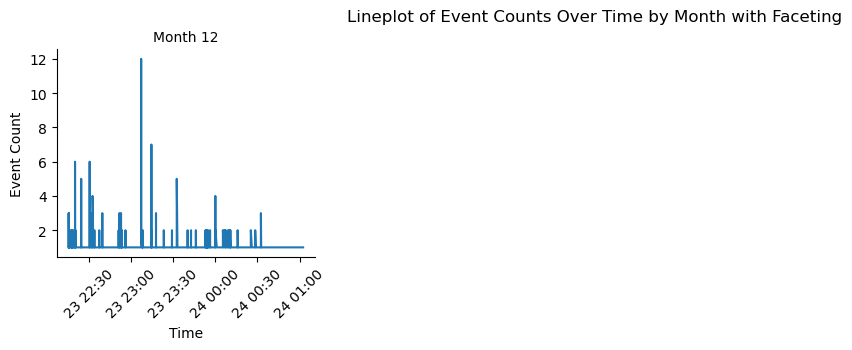

In [94]:
# Lineplot of Event Counts Over Time by Month with Faceting
data['Month'] = data['Time'].dt.month
g = sns.FacetGrid(data=data, col='Month', col_wrap=4, height=3, palette='Set3')
g.map(sns.lineplot, 'Time', 'LineId', estimator=len, errorbar=None)
g.set_axis_labels('Time', 'Event Count')
g.set_titles('Month {col_name}')
g.fig.suptitle('Lineplot of Event Counts Over Time by Month with Faceting', y=1.02)
plt.xticks(rotation=45)
plt.show()


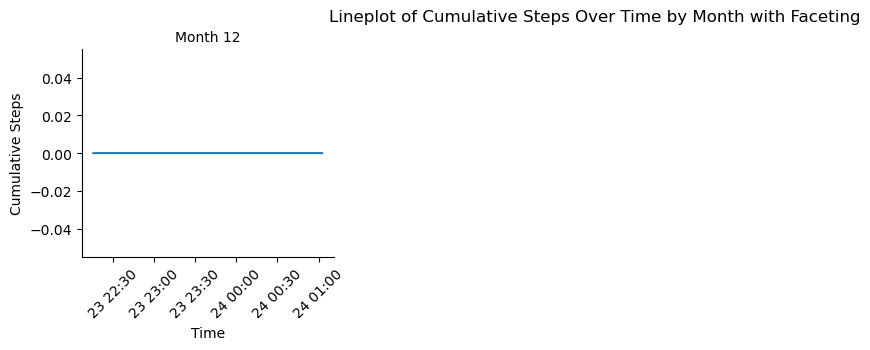

In [95]:
# Lineplot of Cumulative Steps Over Time by Month with Faceting
cumulative_steps_month = data.groupby(['Time', 'Month'])['Steps'].sum().groupby('Month').cumsum().reset_index()
g = sns.FacetGrid(data=cumulative_steps_month, col='Month', col_wrap=4, height=3, palette='Set1')
g.map(sns.lineplot, 'Time', 'Steps')
g.set_axis_labels('Time', 'Cumulative Steps')
g.set_titles('Month {col_name}')
g.fig.suptitle('Lineplot of Cumulative Steps Over Time by Month with Faceting', y=1.02)
plt.xticks(rotation=45)
plt.show()


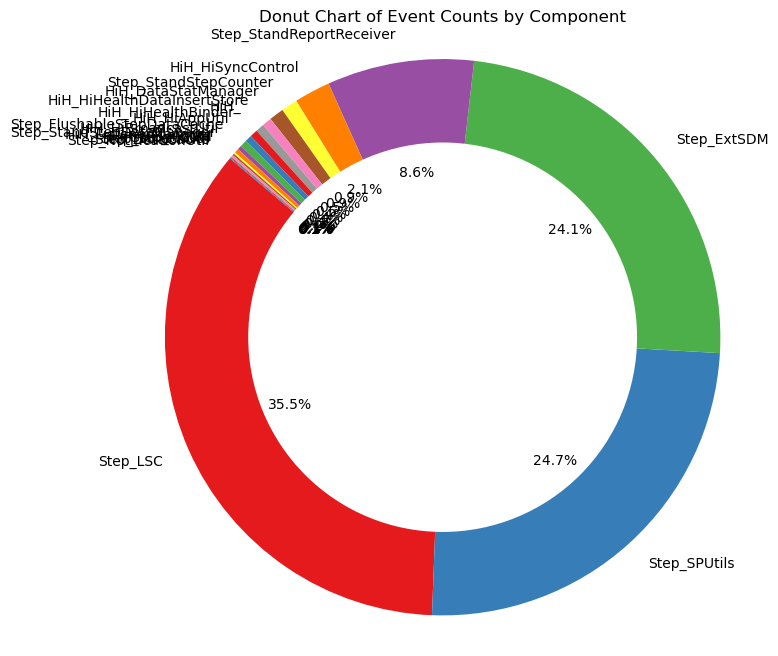

In [96]:
# Donut Chart of Event Counts by Component
component_counts = data['Component'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(component_counts, labels=component_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set1'))
plt.title('Donut Chart of Event Counts by Component')
plt.gca().add_artist(plt.Circle((0, 0), 0.70, fc='white'))
plt.axis('equal')
plt.show()


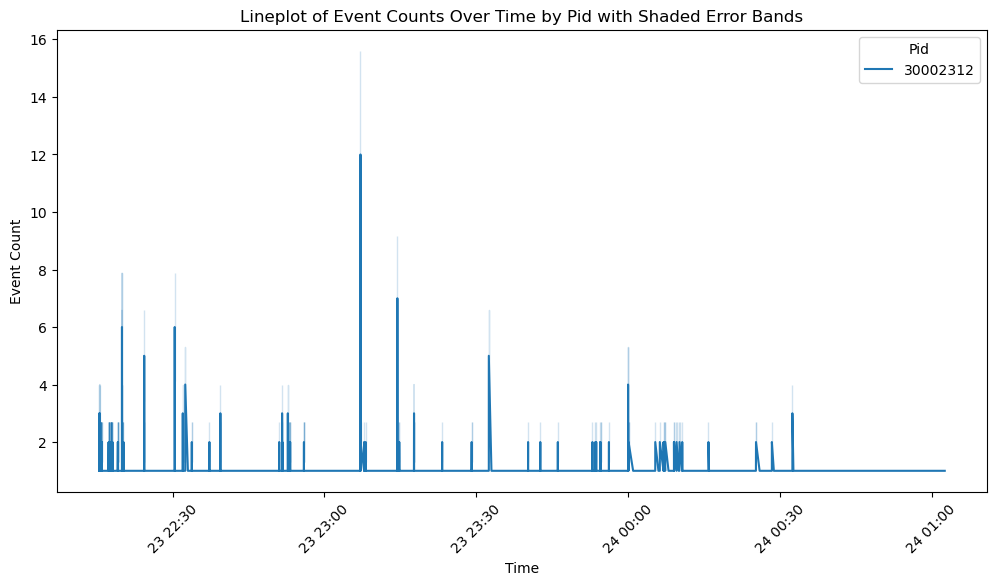

In [97]:
# Lineplot of Event Counts Over Time by Pid with Shaded Error Bands
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Time', y='LineId', hue='Pid', estimator=len, errorbar='sd', palette='tab20')
plt.title('Lineplot of Event Counts Over Time by Pid with Shaded Error Bands')
plt.xlabel('Time')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='Pid')
plt.show()


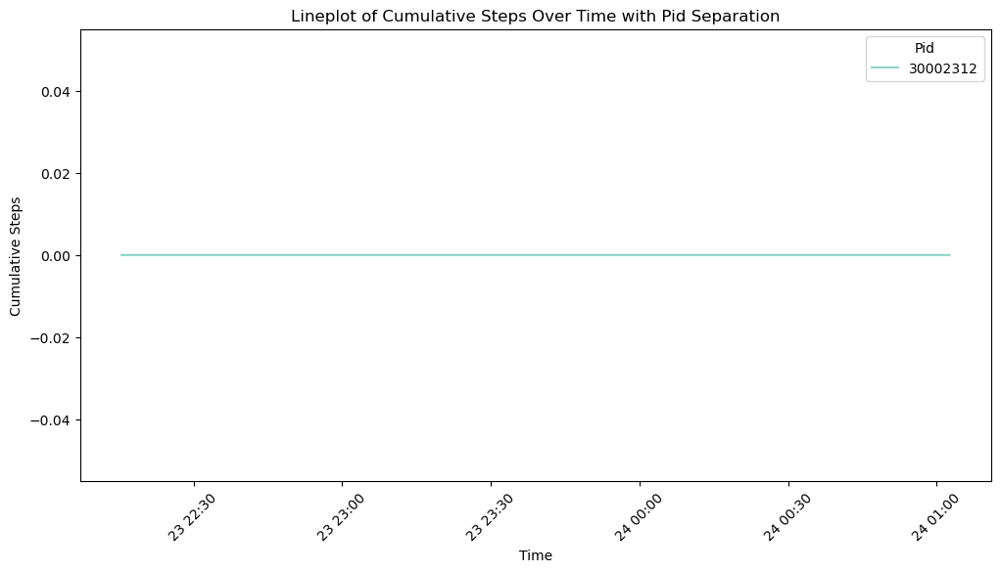

In [98]:
# Lineplot of Cumulative Steps Over Time with Pid Separation
plt.figure(figsize=(12, 6))
cumulative_steps_pid = data.groupby(['Time', 'Pid'])['Steps'].sum().groupby('Pid').cumsum().reset_index()
sns.lineplot(data=cumulative_steps_pid, x='Time', y='Steps', hue='Pid', palette='Set3')
plt.title('Lineplot of Cumulative Steps Over Time with Pid Separation')
plt.xlabel('Time')
plt.ylabel('Cumulative Steps')
plt.xticks(rotation=45)
plt.legend(title='Pid')
plt.show()


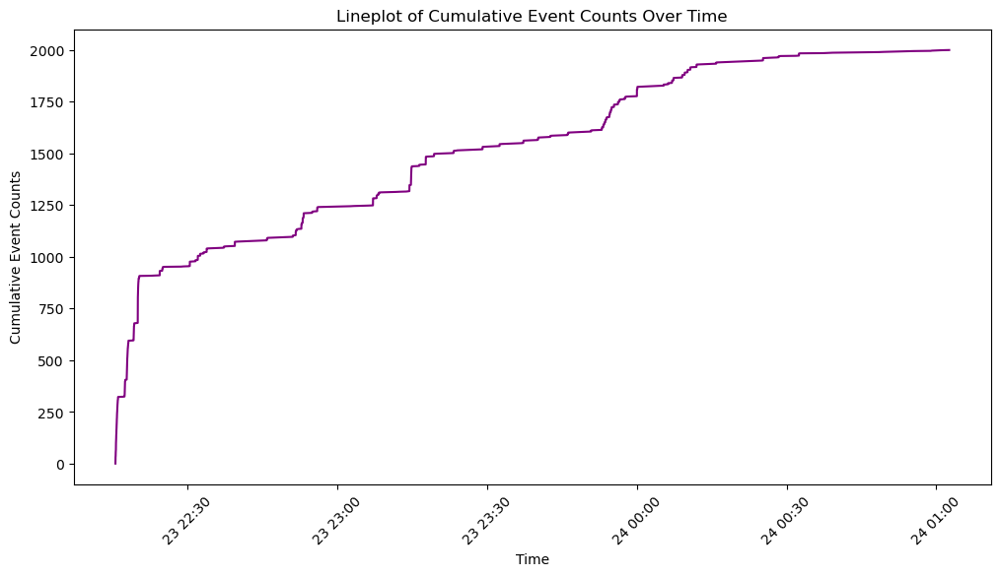

In [99]:
# Lineplot of Cumulative Event Counts Over Time
cumulative_event_counts = data.groupby('Time').size().cumsum().reset_index()
plt.figure(figsize=(12, 6))
sns.lineplot(data=cumulative_event_counts, x='Time', y=0, estimator=None, errorbar=None, color='purple')
plt.title('Lineplot of Cumulative Event Counts Over Time')
plt.xlabel('Time')
plt.ylabel('Cumulative Event Counts')
plt.xticks(rotation=45)
plt.show()


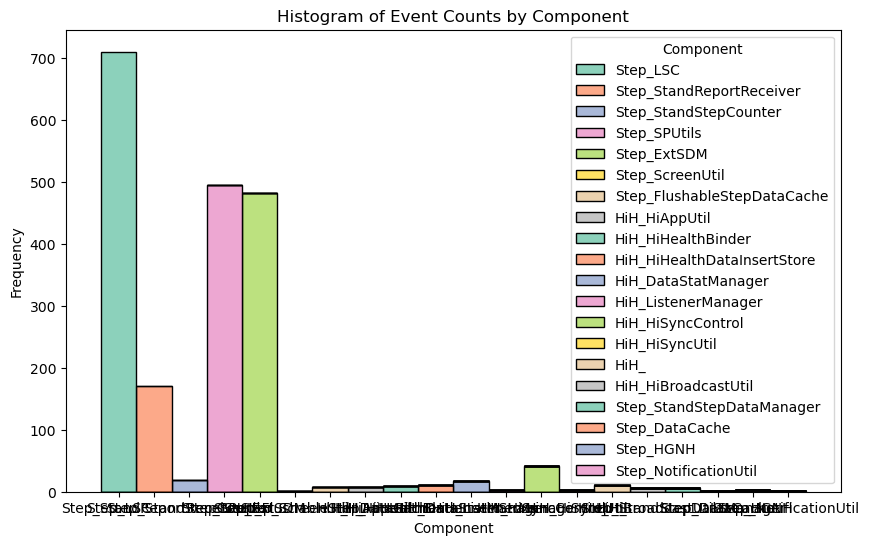

In [100]:
# Histogram of Event Counts by Component
plt.figure(figsize=(10, 6))
sns.histplot(data=data, x='Component', hue='Component', multiple='stack', palette='Set2')
plt.title('Histogram of Event Counts by Component')
plt.xlabel('Component')
plt.ylabel('Frequency')
plt.show()


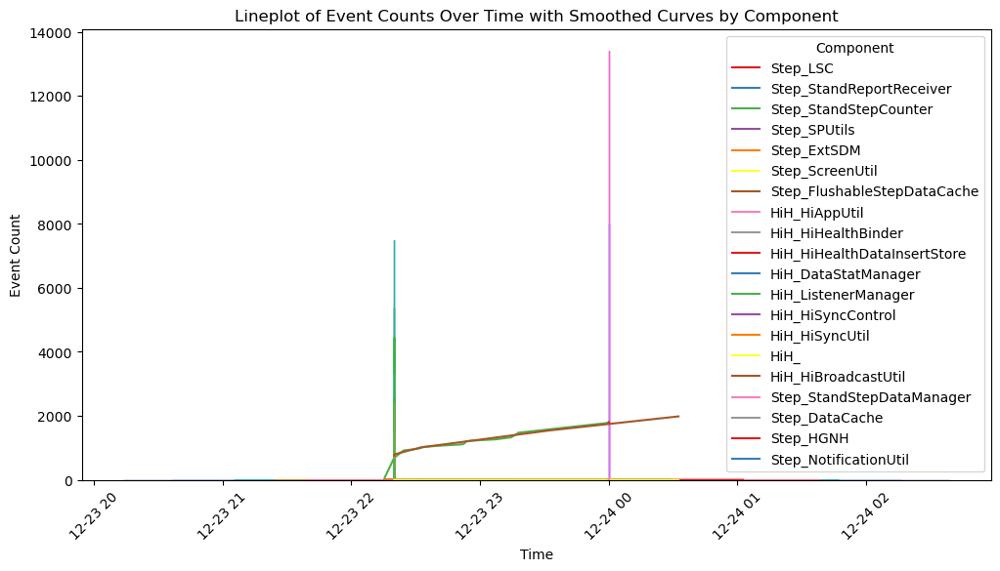

In [101]:
# Lineplot of Event Counts Over Time with Smoothed Curves by Component
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Time', y='LineId', hue='Component', estimator=len, errorbar=None, palette='Set1')
sns.kdeplot(data=data, x='Time', hue='Component', fill=True, alpha=0.5,warn_singular=False)
plt.title('Lineplot of Event Counts Over Time with Smoothed Curves by Component')
plt.xlabel('Time')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='Component')
plt.show()


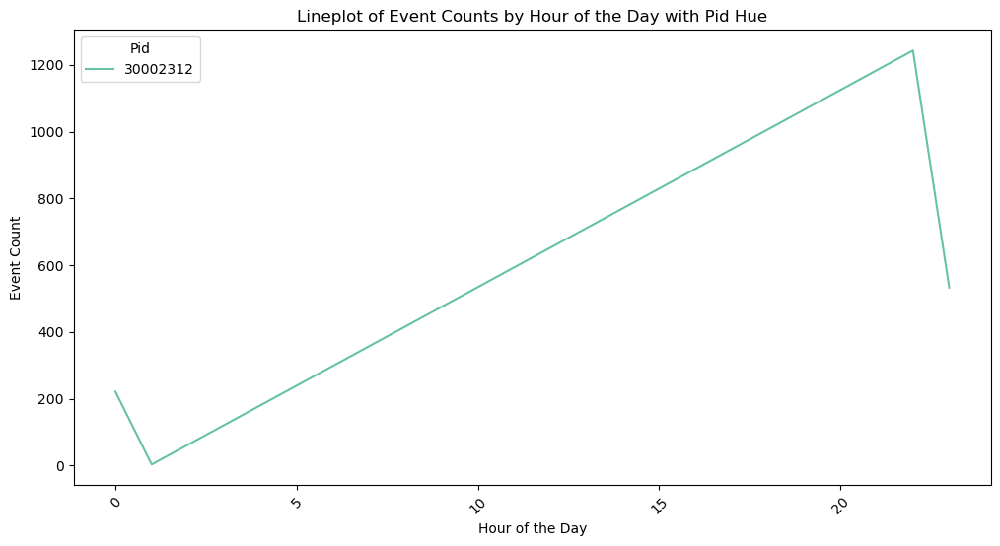

In [102]:
# Lineplot of Event Counts by Hour of the Day with Pid Hue
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Hour', y='LineId', hue='Pid', estimator=len, errorbar=None, palette='Set2')
plt.title('Lineplot of Event Counts by Hour of the Day with Pid Hue')
plt.xlabel('Hour of the Day')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='Pid')
plt.show()


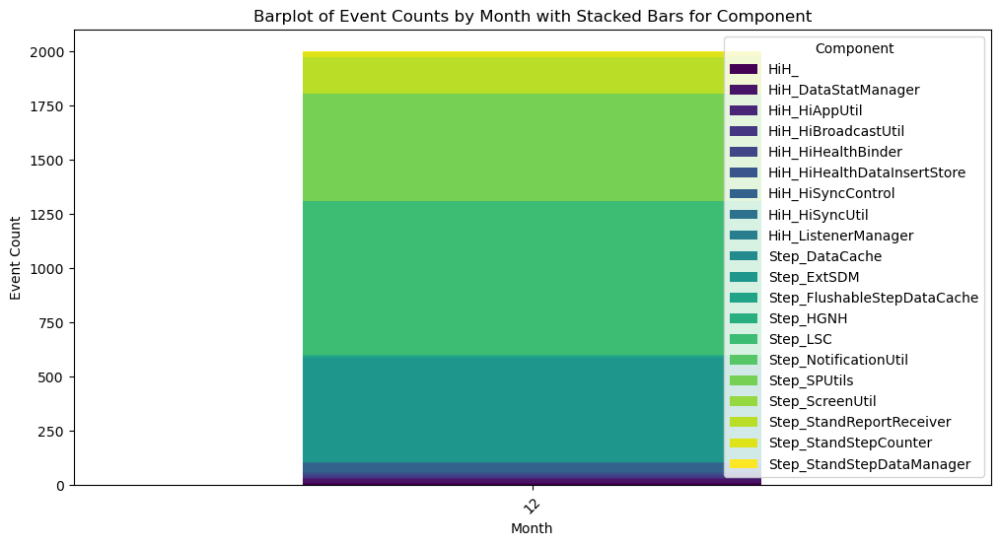

In [103]:
# Barplot of Event Counts by Month with Stacked Bars for Component
monthly_component_counts = data.pivot_table(index='Month', columns='Component', values='LineId', aggfunc='count', fill_value=0)
monthly_component_counts.plot(kind='bar', stacked=True, colormap='viridis', figsize=(12, 6))
plt.title('Barplot of Event Counts by Month with Stacked Bars for Component')
plt.xlabel('Month')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.show()


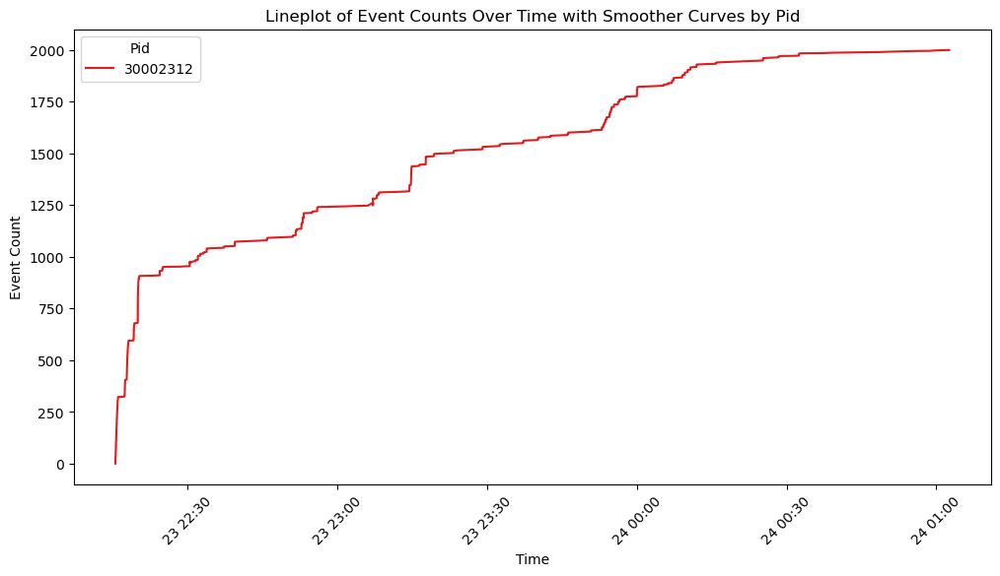

In [104]:
# Lineplot of Event Counts Over Time with Smoother Curves by Pid
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Time', y='LineId', hue='Pid', errorbar='sd', palette='Set1')
plt.title('Lineplot of Event Counts Over Time with Smoother Curves by Pid')
plt.xlabel('Time')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='Pid')
plt.show()


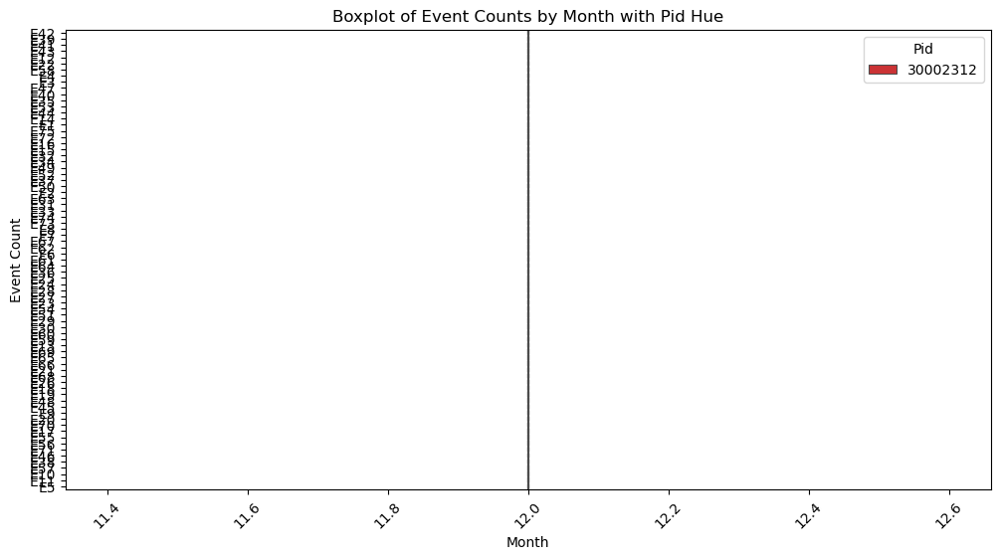

In [105]:
# Boxplot of Event Counts by Month with Pid Hue
plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x='Month', y='EventId', hue='Pid', palette='Set1')
plt.title('Boxplot of Event Counts by Month with Pid Hue')
plt.xlabel('Month')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='Pid')
plt.show()


<Figure size 1200x600 with 0 Axes>

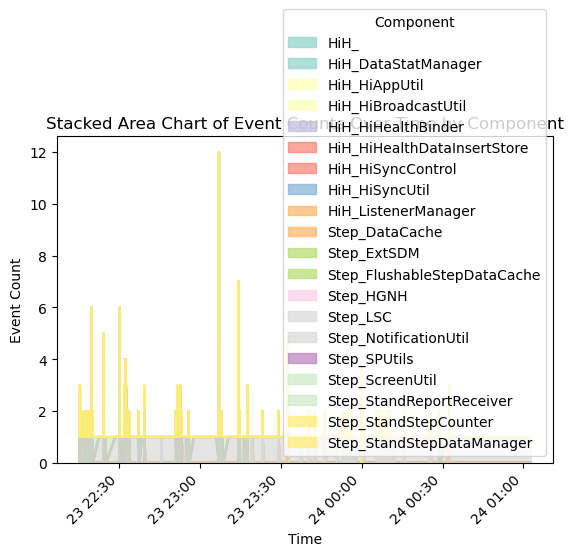

In [106]:
# Stacked Area Chart of Event Counts Over Time by Component
plt.figure(figsize=(12, 6))
component_event_counts = data.pivot_table(index='Time', columns='Component', values='EventId', aggfunc='count', fill_value=0)
component_event_counts.plot(kind='area', colormap='Set3', alpha=0.7)
plt.title('Stacked Area Chart of Event Counts Over Time by Component')
plt.xlabel('Time')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='Component')
plt.show()


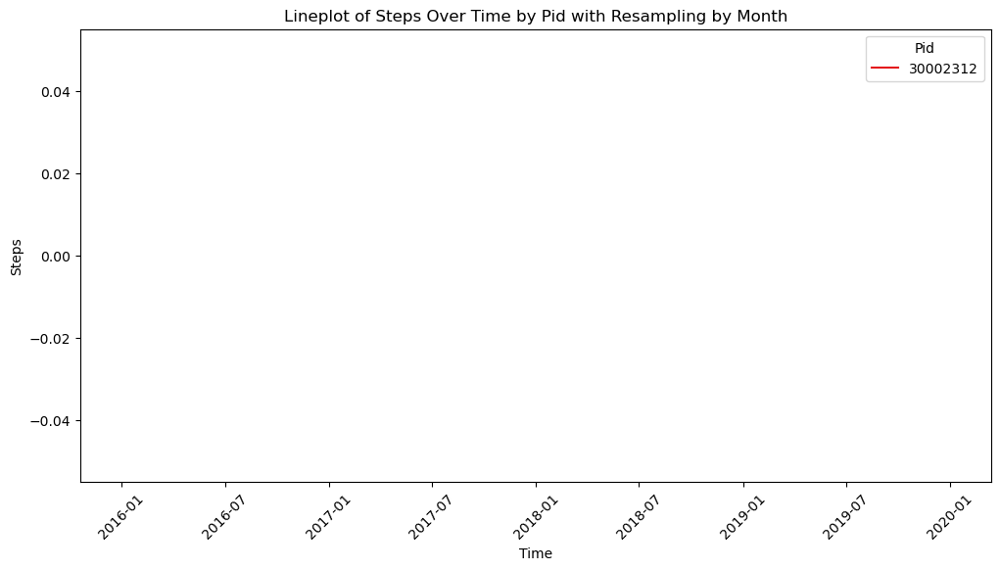

In [107]:
# Lineplot of Steps Over Time by Pid with Resampling by Month
monthly_steps = data.groupby(['Pid', pd.Grouper(freq='M', key='Time')])['Steps'].sum().reset_index()
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_steps, x='Time', y='Steps', hue='Pid', errorbar=None, palette='Set1')
plt.title('Lineplot of Steps Over Time by Pid with Resampling by Month')
plt.xlabel('Time')
plt.ylabel('Steps')
plt.xticks(rotation=45)
plt.legend(title='Pid')
plt.show()


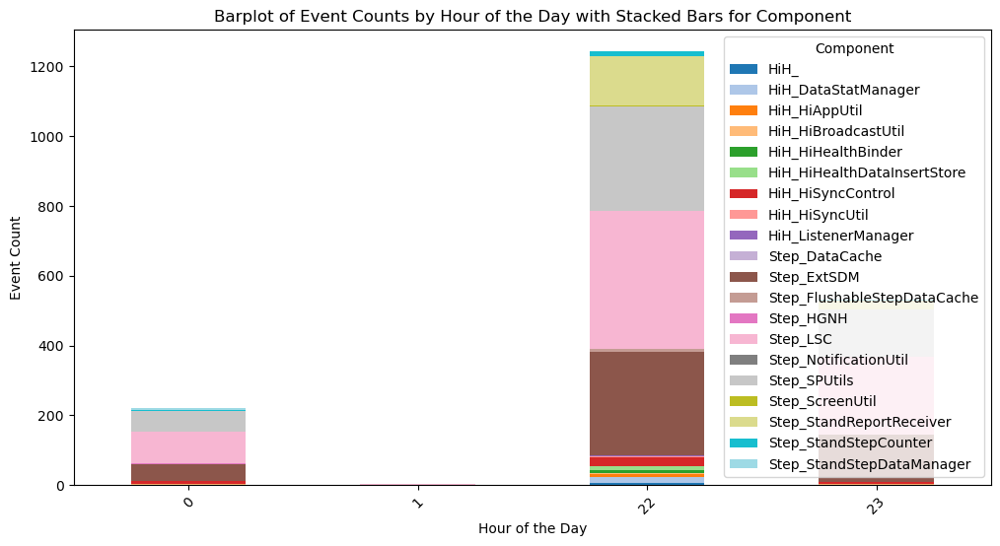

In [108]:
# Barplot of Event Counts by Hour of the Day with Stacked Bars for Component
hourly_component_counts = data.pivot_table(index='Hour', columns='Component', values='EventId', aggfunc='count', fill_value=0)
hourly_component_counts.plot(kind='bar', stacked=True, colormap='tab20', figsize=(12, 6))
plt.title('Barplot of Event Counts by Hour of the Day with Stacked Bars for Component')
plt.xlabel('Hour of the Day')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.show()


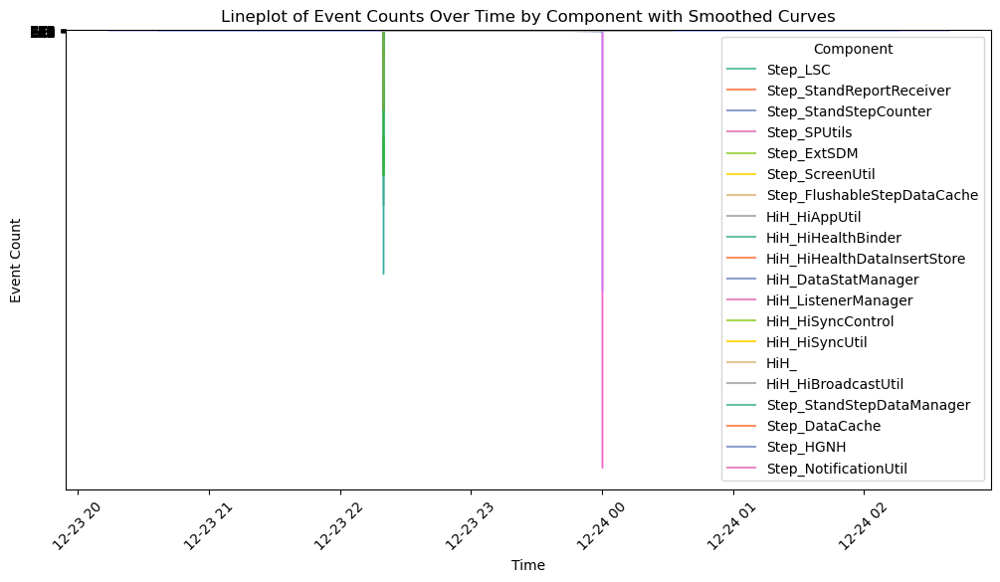

In [109]:
# Lineplot of Event Counts Over Time by Component with Smoothed Curves
plt.figure(figsize=(12, 6))
sns.lineplot(data=data, x='Time', y='EventId', hue='Component', estimator=len, errorbar=None, palette='Set2')
sns.kdeplot(data=data, x='Time', hue='Component', fill=True, alpha=0.5,warn_singular=False)
plt.title('Lineplot of Event Counts Over Time by Component with Smoothed Curves')
plt.xlabel('Time')
plt.ylabel('Event Count')
plt.xticks(rotation=45)
plt.legend(title='Component')
plt.show()
